# **Classification on Intel Image Dataset**

Image classification is an interesting and widely used application of deep learning. This is why I chose to implement one as my final Zero to Gans course project.
My project is not so spectacular, and really not even useful in this form, but that wasn't the goal, I just tried to make a project, which has well-functional parts, and works - after all, all of this is for me to learn. So what You'll read may be not so exciting, but I hope You'll find it interesting enough.

In [1]:
#Import packages I used

import torch
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as tt
#from torchvision.transforms import ToTensor
from torchvision.utils import make_grid
from torch.utils.data.dataloader import DataLoader
from torch.utils.data import random_split
%matplotlib inline
from torchvision.datasets import ImageFolder

import os
from torchvision.datasets import ImageFolder
from torchvision.datasets.utils import download_url

# **PREPROCESSING THE DATA**

The dataset I used for this project is the Intel Image Classification Dataset, what I found on Kaggle. It consists of around 25,000 images, which we can classify into 6 unique classes, which are the follows: buildings, forest, glacier, mountain, sea and street.
My task was to make a model to categorize these images.

In [2]:
#Download data
print("Downloading . . .\n")
for dirname, _, filenames in os.walk('/kaggle/input'):
    print(dirname)
    for filename in filenames:
        os.path.join(dirname, filename)
print("\nFinished downloading.")


/kaggle/input
/kaggle/input/intel-image-classification
/kaggle/input/intel-image-classification/seg_pred
/kaggle/input/intel-image-classification/seg_pred/seg_pred
/kaggle/input/intel-image-classification/seg_train
/kaggle/input/intel-image-classification/seg_train/seg_train
/kaggle/input/intel-image-classification/seg_train/seg_train/glacier
/kaggle/input/intel-image-classification/seg_train/seg_train/sea
/kaggle/input/intel-image-classification/seg_train/seg_train/forest
/kaggle/input/intel-image-classification/seg_train/seg_train/street
/kaggle/input/intel-image-classification/seg_train/seg_train/mountain
/kaggle/input/intel-image-classification/seg_train/seg_train/buildings
/kaggle/input/intel-image-classification/seg_test
/kaggle/input/intel-image-classification/seg_test/seg_test
/kaggle/input/intel-image-classification/seg_test/seg_test/glacier
/kaggle/input/intel-image-classification/seg_test/seg_test/sea
/kaggle/input/intel-image-classification/seg_test/seg_test/forest
/kaggle

In [3]:
#Define classes from the data description
classes = { 0: 'buildings',
            1: 'forest',
            2: 'glacier',
            3: 'mountain',
            4: 'sea',
            5: 'street'}

Since I had some trouble with the dimensions, I checked the images in the dataset, and there are some problematic image sizes. 48 images in the training set, 7 in the validation set, and another 14 images in the test set have different sizes than 150 × 150, so I had to reshape them, that is why I have the *transforms.Resize()* function here.

In [4]:
#Data paths
train_path = "../input/intel-image-classification/seg_train/seg_train/"
test_path ="../input/intel-image-classification/seg_test/seg_test/"
pred_path = "../input/intel-image-classification/seg_pred/"

In [5]:
#Transforms for the basic datasets
train_tf = tt.Compose([tt.Resize((150,150)),tt.ToTensor()])
test_tf = tt.Compose([tt.Resize((150,150)),tt.ToTensor()])
pred_tf = tt.Compose([tt.Resize((150,150)),tt.ToTensor()])

In [6]:
#Create basic datasets
dataset = ImageFolder(train_path, transform = train_tf)
test_ds = ImageFolder(test_path, transform = test_tf)
pred_ds = ImageFolder(pred_path, transform = pred_tf)

In [7]:
num_classes = len(dataset.classes)
print("Number of classes: ", num_classes)
print(classes)

Number of classes:  6
{0: 'buildings', 1: 'forest', 2: 'glacier', 3: 'mountain', 4: 'sea', 5: 'street'}


To visualize, I plotted some images with their labels. This code could have been nicer, but it do its job.

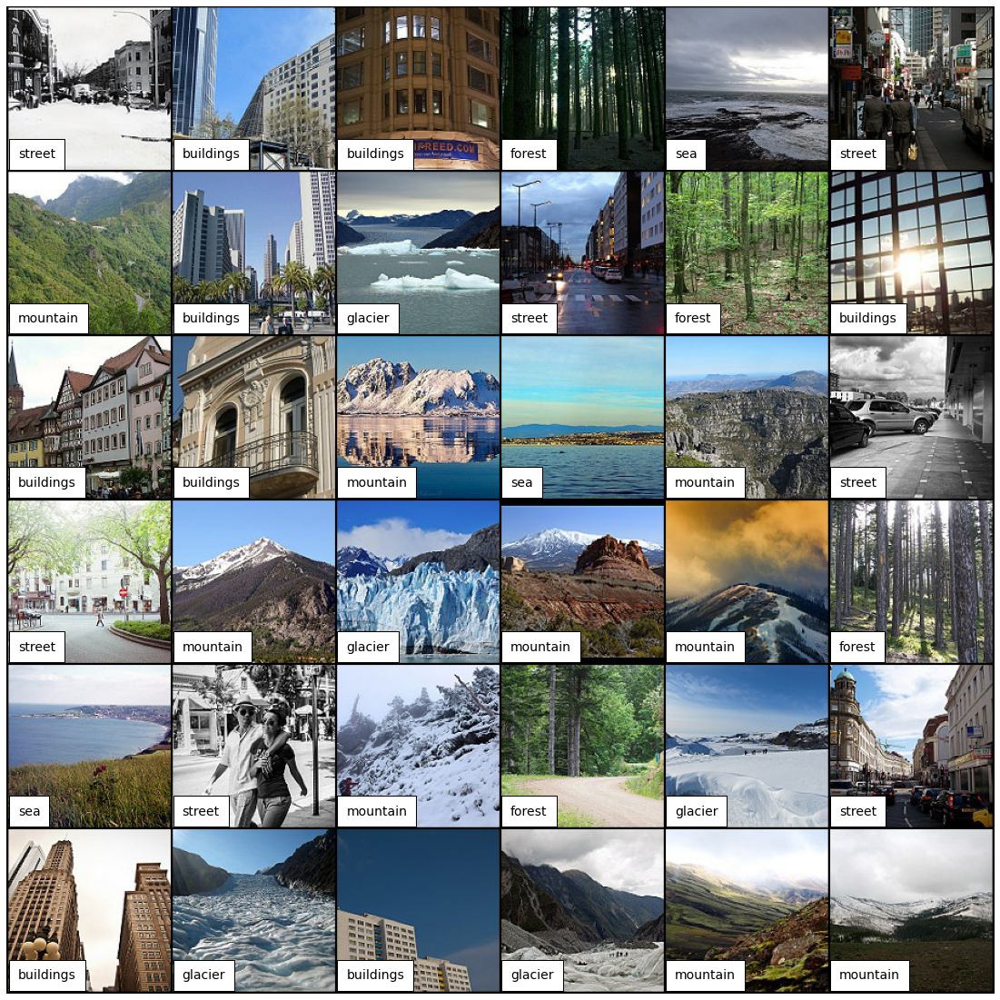

In [8]:
# 36 random images with their labels from the basic dataset

show_loader = DataLoader(dataset, 36, shuffle=True)

for images, labels in show_loader:
    plt.figure(figsize=(20,20))
    plt.axis('off')
    plt.imshow(make_grid(images, nrow=6).permute((1, 2, 0)))
    for index, cl in enumerate(labels):
        if index < 6:
            plt.text(index*(images[0].shape[1]+2)+10, 
                     +140+index//6*(images[0].shape[2]+2), classes[cl.item()], 
                     bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 12 and index > 5:
            plt.text((index-6)*(images[0].shape[1]+2)+10, 
                     +140+index//6*(images[0].shape[2]+2), classes[cl.item()], 
                     bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 18 and index > 11:
            plt.text((index-12)*(images[0].shape[1]+2)+10, 
                     +140+index//6*(images[0].shape[2]+2), classes[cl.item()], 
                     bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 24 and index > 17:
            plt.text((index-18)*(images[0].shape[1]+2)+10, 
                     +140+index//6*(images[0].shape[2]+2), classes[cl.item()], 
                     bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 30 and index > 23:
            plt.text((index-24)*(images[0].shape[1]+2)+10, 
                     +140+index//6*(images[0].shape[2]+2), classes[cl.item()], 
                     bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 36 and index > 29:
            plt.text((index-30)*(images[0].shape[1]+2)+10, 
                     +140+index//6*(images[0].shape[2]+2), classes[cl.item()], 
                     bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
    break

If we want to normalize an image (or a group of images), we have to know some of its properties - we need the mean and standard deviation of the pixels. Though I found some values on the internet, I used a code block to determine them, and it resulted a bit different values. That was the second case, I found something differs from what I knew before about the dataset, so it can be a recommendation, to always investigate the data ourselves.

In [9]:
#Calculate mean and std on dataset

loader = DataLoader(dataset, batch_size=1024)

nimgs = 0
mean = 0.
std = 0.
for batch, _ in loader:
    batch = batch.reshape(batch.size(0), batch.size(1), -1) #[B × C × H*W]
    # Update total number of images
    nimgs += batch.size(0)

    mean += batch.mean(2).sum(0) 
    std += batch.std(2).sum(0)

mean /= nimgs
std /= nimgs

print(mean)
print(std)

tensor([0.4302, 0.4575, 0.4539])
tensor([0.2361, 0.2347, 0.2432])


In [10]:
calculated_stats = [mean.tolist(), std.tolist()]
print(calculated_stats)

[[0.43018344044685364, 0.45747971534729004, 0.45386454463005066], [0.23611854016780853, 0.2346806824207306, 0.2432306706905365]]


In [11]:
#Stats for normalizing found on the internet
#stats_from_net = ((0.485, 0.456, 0.406),(0.229, 0.224, 0.225))

In [12]:
#Transform settings for modded datasets
mod_train_tf = tt.Compose([  tt.Resize((150,150)), 
                         tt.RandomHorizontalFlip(),
                         tt.RandomCrop(150, padding=4, padding_mode='reflect'), 
                         tt.ToTensor(),
                         tt.RandomErasing(inplace=True, scale=(0.01, 0.15)),
                         tt.Normalize(*calculated_stats,inplace=True)])

The normalization can be used by itself, but we can apply different transformations on the dataset, which can have a pozitive impact on the training process, this is called data augmentation.

In [13]:
#Transform settings for normalized datasets
norm_train_tf = tt.Compose([  tt.Resize((150,150)), 
                         tt.ToTensor(),
                         tt.Normalize(*calculated_stats,inplace=True)])

Since there wasn't dedicated validation set, I used the random_split function to separate around 20% of the dataset for this purpose, the remainder became the training set. Test dataset was included in the dataset, so that wasn't a problem. I also had a prediction dataset with around 7,000 images, which has no labels at all - the dataset was a part of a competition.

In [14]:
batch_size = 64

#Calculate validation size
val_size = len(dataset) // 5
#Define the train, val, test and pred set sizes
train_size = len(dataset) - val_size
test_size = len(test_ds)
pred_size = len(pred_ds)

#Split the dataset to training and validation sets
torch.manual_seed(11)
train_ds, val_ds = random_split(dataset, [train_size, val_size])

#DataLoader from the basic datasets
train_dl = DataLoader(train_ds, batch_size, shuffle = True, 
                      num_workers=4, pin_memory=True)
val_dl = DataLoader(val_ds, batch_size, 
                    num_workers=4, pin_memory=True)

test_dl = DataLoader(test_ds, batch_size, 
                     num_workers=4, pin_memory=True)

print("Size of training dataset: ", train_size)
print("Size of validational datast: ", val_size)
print("Size of test dataset: ", test_size)

Size of training dataset:  11228
Size of validational datast:  2806
Size of test dataset:  3000


In [15]:
#Create modded dataset with its transforms
mod_dataset = ImageFolder(train_path, transform = mod_train_tf)

#Create normalized dataset with its transforms
norm_dataset = ImageFolder(train_path, transform = norm_train_tf)
norm_test_ds = ImageFolder(test_path, transform = norm_train_tf)

In [16]:
#Split the modded dataset to training and validation sets

torch.manual_seed(11)
mod_train_ds, garbage0 = random_split(mod_dataset, [train_size, val_size])
torch.manual_seed(11)
garbage1, mod_val_ds = random_split(norm_dataset, [train_size, val_size])

#Create DataLoaders
mod_train_dl = DataLoader(mod_train_ds, batch_size, shuffle = True, 
                          num_workers=4, pin_memory=True)
mod_val_dl = DataLoader(mod_val_ds, batch_size, 
                        num_workers=4, pin_memory=True)


#Split the normalized dataset to training and validation sets
torch.manual_seed(11)
norm_train_ds, norm_val_ds = random_split(norm_dataset, [train_size, val_size])

#Create DataLoaders
norm_train_dl = DataLoader(norm_train_ds, batch_size, shuffle = True, 
                           num_workers=4, pin_memory=True)
norm_val_dl = DataLoader(norm_val_ds, batch_size, 
                         num_workers=4, pin_memory=True)
norm_test_dl = DataLoader(norm_test_ds, batch_size, 
                          num_workers=4, pin_memory=True)

I showed some images after data augmentation and images which has normalized below. For us, the normalization didn't help, moreover some picture became unrecognizable, we'll figure out, weather itt helped the model or we share our opinion.

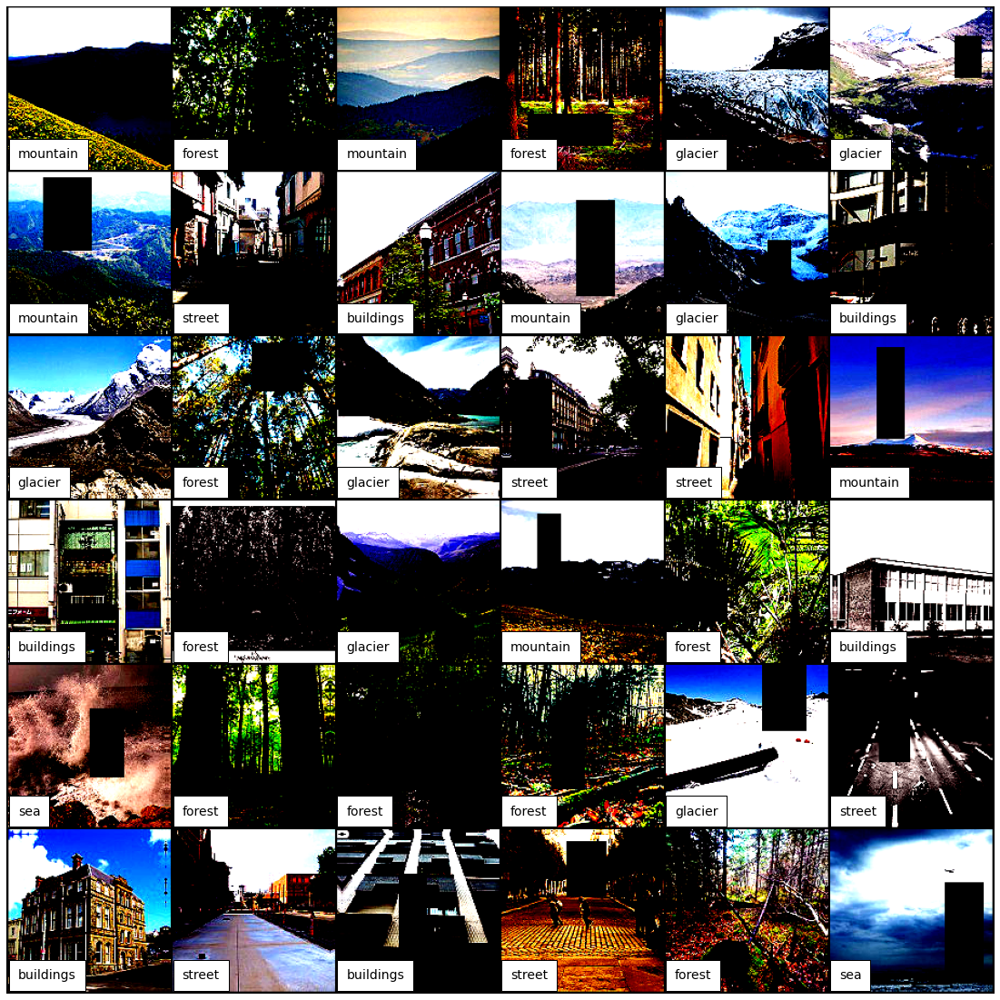

In [17]:
#36 random images with their labels from the modded dataset

show_loader = DataLoader(mod_dataset, 36, shuffle=True)

for images, labels in show_loader:
    plt.figure(figsize=(20,20))
    plt.axis('off')
    plt.imshow(make_grid(images, nrow=6).permute((1, 2, 0)))
    for index, cl in enumerate(labels):
        if index < 6:
            plt.text(index*(images[0].shape[1]+2)+10, +140+index//6*(images[0].shape[2]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 12 and index > 5:
            plt.text((index-6)*(images[0].shape[1]+2)+10, +140+index//6*(images[0].shape[2]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 18 and index > 11:
            plt.text((index-12)*(images[0].shape[1]+2)+10, +140+index//6*(images[0].shape[2]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 24 and index > 17:
            plt.text((index-18)*(images[0].shape[1]+2)+10, +140+index//6*(images[0].shape[2]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 30 and index > 23:
            plt.text((index-24)*(images[0].shape[1]+2)+10, +140+index//6*(images[0].shape[2]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 36 and index > 29:
            plt.text((index-30)*(images[0].shape[1]+2)+10, +140+index//6*(images[0].shape[2]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
    break

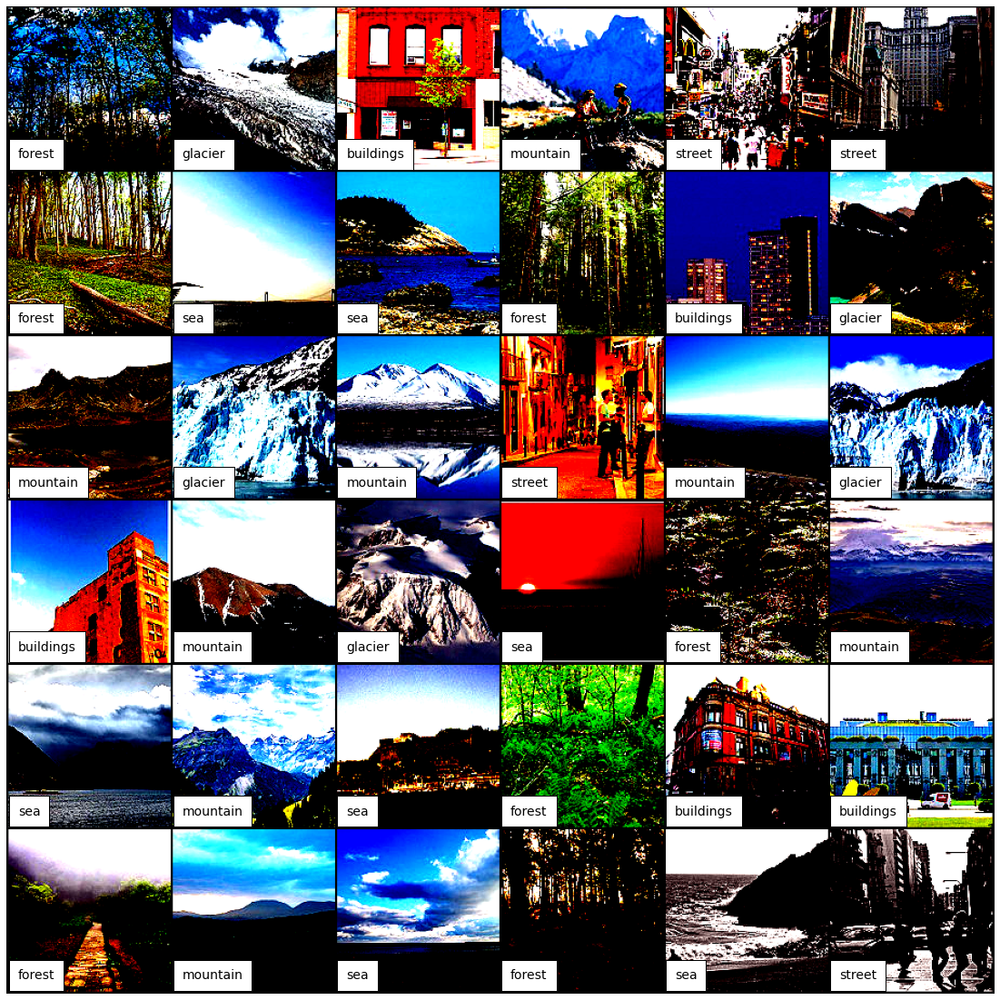

In [18]:
#36 random images with their labels from the normalized dataset

show_loader = DataLoader(norm_dataset, 36, shuffle=True)

for images, labels in show_loader:
    plt.figure(figsize=(20,20))
    plt.axis('off')
    plt.imshow(make_grid(images, nrow=6).permute((1, 2, 0)))
    for index, cl in enumerate(labels):
        if index < 6:
            plt.text(index*(images[0].shape[1]+2)+10, +140+index//6*(images[0].shape[2]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 12 and index > 5:
            plt.text((index-6)*(images[0].shape[1]+2)+10, +140+index//6*(images[0].shape[2]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 18 and index > 11:
            plt.text((index-12)*(images[0].shape[1]+2)+10, +140+index//6*(images[0].shape[2]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 24 and index > 17:
            plt.text((index-18)*(images[0].shape[1]+2)+10, +140+index//6*(images[0].shape[2]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 30 and index > 23:
            plt.text((index-24)*(images[0].shape[1]+2)+10, +140+index//6*(images[0].shape[2]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 36 and index > 29:
            plt.text((index-30)*(images[0].shape[1]+2)+10, +140+index//6*(images[0].shape[2]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
    break

After I had that many dataset, I got courios, how colorness affects the learning of a model - so I created a grayscaled dataset from the original one.
I know, there must be a dozen biuld-in or third-party functions for this task, what do its job quickly, maybe more accurately, this procedure was one of the few operations I remembered from school, so I wrote my own one to do it.

In [19]:
#Create grayscale dataset from the raw dataset
gray_dataset = []


for rgb, label in dataset:
    ans = rgb[0] *0.299 + rgb[1] *0.587 + rgb[2] *0.114
    gray_dataset.append([ans, label])

#Create a grayscale test dataset too
gray_test_ds = []

for rgb, label in test_ds:
    ans = rgb[0] *0.299 + rgb[1] *0.587 + rgb[2] *0.114
    gray_test_ds.append([ans, label])

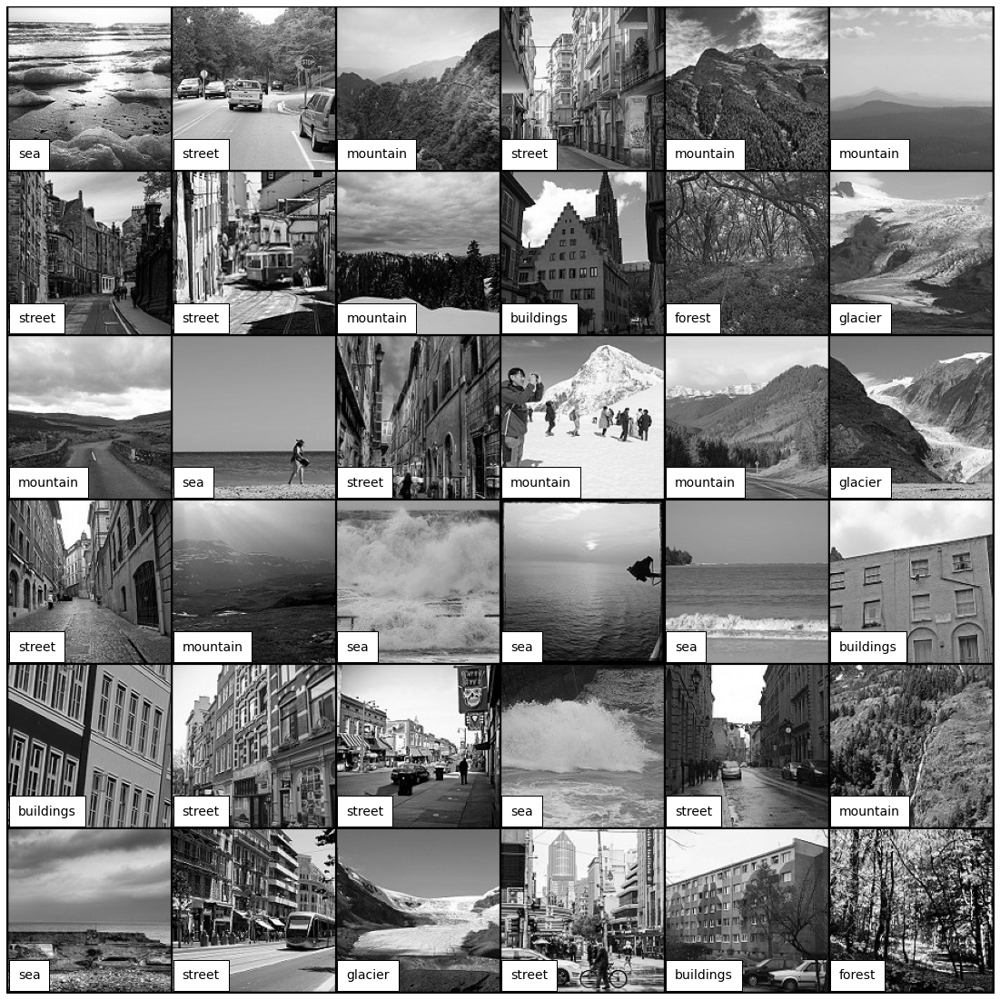

In [20]:
#36 images with their labels from the grayscale dataset

show_loader = DataLoader(gray_dataset, 36, shuffle=True)

for images, labels in show_loader:
    plt.figure(figsize=(20,20))
    plt.axis('off')
    plt.imshow(make_grid(images.unsqueeze(1), nrow=6).permute((1, 2, 0)))
    for index, cl in enumerate(labels):
        if index < 6:
            plt.text(index*(images[0].shape[0]+2)+10, +140+index//6*(images[0].shape[1]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 12 and index > 5:
            plt.text((index-6)*(images[0].shape[0]+2)+10, +140+index//6*(images[0].shape[1]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 18 and index > 11:
            plt.text((index-12)*(images[0].shape[0]+2)+10, +140+index//6*(images[0].shape[1]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 24 and index > 17:
            plt.text((index-18)*(images[0].shape[0]+2)+10, +140+index//6*(images[0].shape[1]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 30 and index > 23:
            plt.text((index-24)*(images[0].shape[0]+2)+10, +140+index//6*(images[0].shape[1]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
        if index < 36 and index > 29:
            plt.text((index-30)*(images[0].shape[0]+2)+10, +140+index//6*(images[0].shape[1]+2), classes[cl.item()], bbox={'facecolor': 'white', 'pad': 10}, fontsize=14)
    break

In [21]:
#Create grayscaled training and validation sets
torch.manual_seed(11)
gray_train_ds, gray_val_ds = random_split(gray_dataset, [train_size, val_size])

#Create DataLoaders for grayscale sets
gray_train_dl = DataLoader(gray_train_ds, batch_size, shuffle = True, 
                           num_workers=4, pin_memory=True)
gray_val_dl = DataLoader(gray_val_ds, batch_size, 
                         num_workers=4, pin_memory=True)

gray_test_dl = DataLoader(gray_test_ds, batch_size, 
                          num_workers=4, pin_memory=True)

After I finished my exhibition, I determined the dispersion of the data - it wouldn't help, if one class carries the majority of all the images, and the others have barely some.
As we can see, that isn't the case, the dataset seems homogeneously distributed, and redy for the model.

In [22]:
#Checking the distribution of classes in the training, 
#validation and test sets

num_in_classes_train = torch.zeros(num_classes)

for img, labels in train_ds:
    num_in_classes_train[labels] += 1
         

num_in_classes_val = torch.zeros(num_classes)

for img, labels in val_ds:
    num_in_classes_val[labels] += 1
         

num_in_classes_test = torch.zeros(num_classes)

for img, labels in test_ds:
    num_in_classes_test[labels] += 1
         

#Sizes of the different sets
print("Length of training dataset: \t", len(mod_train_ds))
print("Length of validational dataset:  ", len(mod_val_ds))
print("Length of test dataset: \t ", len(test_ds))

train_size = len(mod_train_ds)
val_size = len(mod_val_ds)
test_size = len(test_ds)

Length of training dataset: 	 11228
Length of validational dataset:   2806
Length of test dataset: 	  3000


Dispersion of classes in the training and validation sets
Items per classes in the training set:  tensor([1784., 1826., 1938., 1972., 1811., 1897.])
Items per classes in the validation set:  tensor([407., 445., 466., 540., 463., 485.])
Items per classes in the test set:  tensor([437., 474., 553., 525., 510., 501.])


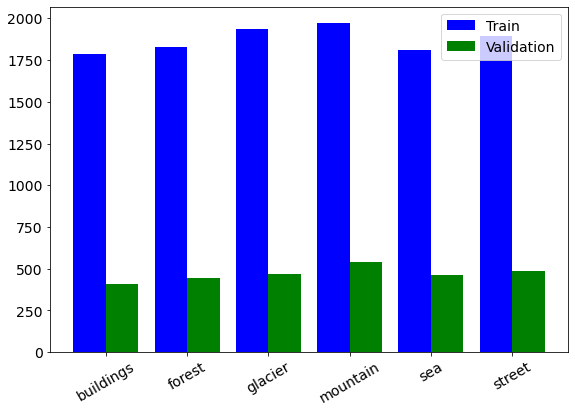

In [23]:
#Create graph to illustrate the image class distribution 
#in the training and validation sets

X = np.arange(num_classes)
fig = plt.figure()
ax = fig.add_axes([0,0,1.2,1.2])
ax.bar(X -0.2, num_in_classes_train, color = 'b', width = 0.4)
ax.bar(X + 0.2, num_in_classes_val, color = 'g', width = 0.4)
ax.legend(['Train', 'Validation'], fontsize = 14)

plt.xticks(X, dataset.classes, fontsize=14, rotation=30)
plt.yticks(fontsize=14)

print("Dispersion of classes in the training and validation sets")



print("Items per classes in the training set: ", num_in_classes_train)
print("Items per classes in the validation set: ", num_in_classes_val)
print("Items per classes in the test set: ", num_in_classes_test)

# **GPU**

The GPUs can much more faster carry out some kind of tasks, and matrix operations are one of them. Since in this project the most calculations are related to matrices, if we have the opportunity, we should use GPUs insted of CPUs, therefore I had to move the data to the GPU. That moving mission is performed by this cell of code, what we used through this course.

In [24]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

If we have no access to a GPU, this isn't a problem, in this case we aren't moving anywhere.

In [25]:
device = get_default_device()
device

device(type='cuda')

In [26]:
#Putting DataLoaders to GPU

train_dl = DeviceDataLoader(train_dl, device)
val_dl = DeviceDataLoader(val_dl, device)
test_dl = DeviceDataLoader(test_dl, device)

mod_train_dl = DeviceDataLoader(mod_train_dl, device)
mod_val_dl = DeviceDataLoader(mod_val_dl, device)

gray_train_dl = DeviceDataLoader(gray_train_dl, device)
gray_val_dl = DeviceDataLoader(gray_val_dl, device)
gray_test_dl = DeviceDataLoader(gray_test_dl, device)

norm_train_dl = DeviceDataLoader(norm_train_dl, device)
norm_val_dl = DeviceDataLoader(norm_val_dl, device)
norm_test_dl = DeviceDataLoader(norm_test_dl, device)


In [27]:
for i in range(0, 2000, 56):
    print(val_ds[i][1], end='')
    print(norm_val_ds[i][1])
#means the validation and the norm validation set is the same - we can use the normalized validation set and train with the modded dataset

44
22
00
33
11
11
44
55
11
33
33
44
44
44
11
55
00
33
11
44
22
44
33
11
22
11
22
33
55
11
33
00
22
22
22
55



# **MODELS**

In this section I created some models. Since my basic goal wasn't building the most accurate predictive system, there are just some simple (convolutional) neural networks. If the project works with them, it'll work with massive networks as well.

In [28]:
class Model0_gray(nn.Module):
    def __init__(self):
        super().__init__()
        self.linear1 = nn.Linear(150*150, 4096)
        self.linear2 = nn.Linear(4096, 512)
        self.linear3 = nn.Linear(512, 64)
        self.linear4 = nn.Linear(64, 6)
        
    def forward(self, xb):
        #(1) input layer
        xb = xb.reshape(-1, 150*150)
        out = self.linear1(xb)
        out = F.relu(out)
        
        #(2) hidden linear layer
        out = self.linear2(out)
        out = F.relu(out)
        
        #(3) hidden linear layer
        out = self.linear3(out)
        out = F.relu(out)
        
        #(4) output layer
        out = self.linear4(out)
        
        return out

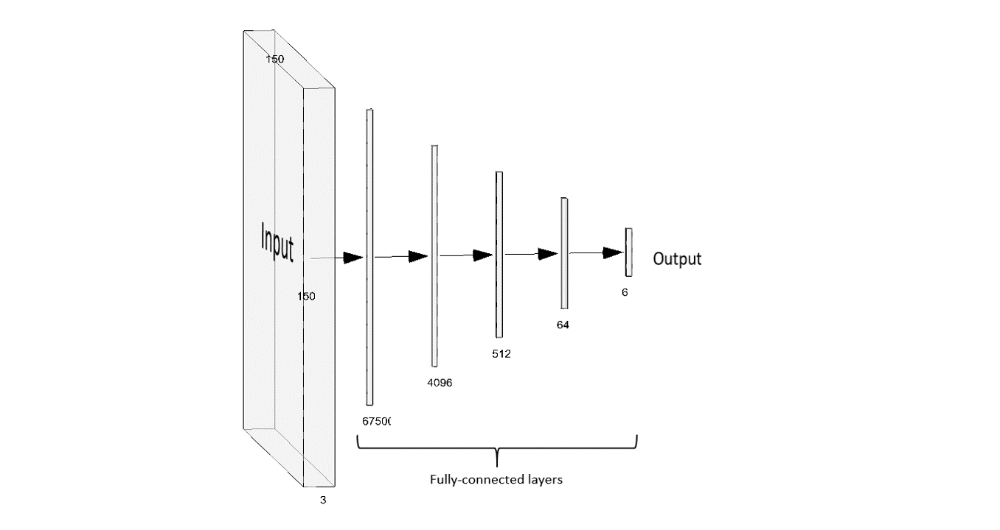

In [29]:
class Model0(nn.Module):
    def __init__(self):
        super().__init__()
        self.linear1 = nn.Linear(150*150*3, 4096)
        self.linear2 = nn.Linear(4096, 512)
        self.linear3 = nn.Linear(512, 64)
        self.linear4 = nn.Linear(64, 6)
        
    def forward(self, xb):
        #(1) input layer
        xb = xb.reshape(-1, 150*150*3)
        out = self.linear1(xb)
        out = F.relu(out)
        
        #(2) hidden linear layer
        out = self.linear2(out)
        out = F.relu(out)
        
        #(3) hidden linear layer
        out = self.linear3(out)
        out = F.relu(out)
        
        #(4) output layer
        out = self.linear4(out)
        
        return out

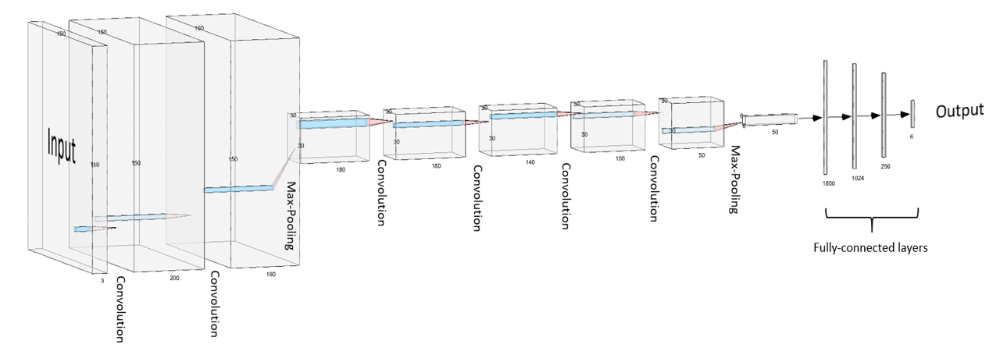

In [30]:
class Model1(nn.Module):
    def __init__(self, ninput=3, noutput=6):
        super().__init__()
        self.ninput = ninput
        self.conv1 = nn.Conv2d(in_channels=ninput, out_channels=200, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=200, out_channels=180, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels=180, out_channels=180, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(in_channels=180, out_channels=140, kernel_size=3, padding=1)
        self.conv5 = nn.Conv2d(in_channels=140, out_channels=100, kernel_size=3, padding=1)
        self.conv6 = nn.Conv2d(in_channels=100, out_channels=50, kernel_size=3, padding=1)
        
        self.linear1 = nn.Linear(in_features=50*6*6, out_features=1024)
        self.linear2 = nn.Linear(in_features=1024, out_features=256)
        self.out = nn.Linear(in_features=256, out_features=noutput)
        
    def forward(self, xb):
        # (1) input layer
        if self.ninput == 1: #If it is a grayscale image, not an RGB one
            xb = xb.unsqueeze(1)
        else:
            xb = xb

        # (2) hidden conv layer
        xb = self.conv1(xb) # 150
        xb = F.relu(xb)

        # (3) hidden conv layer
        xb = self.conv2(xb)
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=5, stride=5) # 150 -> 30
        
        # (4) hidden conv layer
        xb = self.conv3(xb)
        xb = F.relu(xb)
        
        # (5) hidden conv layer
        xb = self.conv4(xb)
        xb = F.relu(xb)
        
        # (6) hidden conv layer
        xb = self.conv5(xb)
        xb = F.relu(xb)

        
        # (7) hidden conv layer
        xb = self.conv6(xb)
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=5, stride=5) # 30 -> 6
        
        

        # (8) hidden linear layer
        xb = xb.reshape(-1, 50*6*6)
        xb = self.linear1(xb)
        xb = F.relu(xb)

        # (9) hidden linear layer
        xb = self.linear2(xb)
        xb = F.relu(xb)

        # (10) output layer
        out = self.out(xb)

        return out

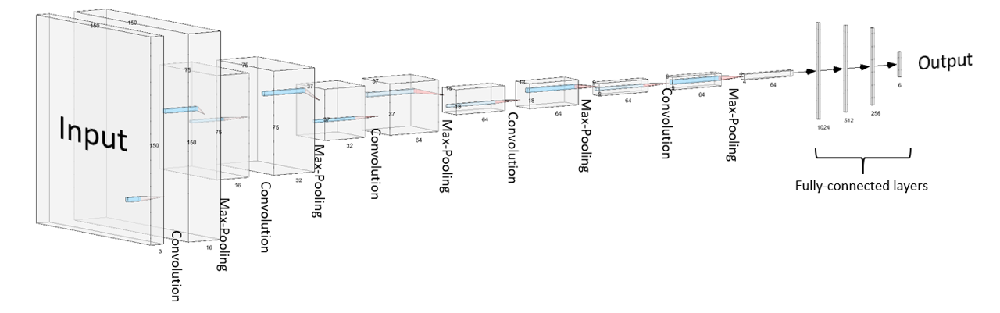

In [31]:
class Model2(nn.Module):
    def __init__(self, ninput=3, noutput=6):
        super().__init__()
        self.ninput = ninput
        self.conv1 = nn.Conv2d(in_channels=ninput, out_channels=16, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1)
        self.conv5 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1)
        
        self.linear1 = nn.Linear(in_features=64*4*4, out_features=512)
        self.linear2 = nn.Linear(in_features=512, out_features=256)
        self.out = nn.Linear(in_features=256, out_features=noutput)
        
    def forward(self, xb):
        # (1) input layer
        if self.ninput == 1: #If it is a grayscale image, not an RGB one
            xb = xb.unsqueeze(1)
        else:
            xb = xb

        # (2) hidden conv layer
        xb = self.conv1(xb) # 150
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) # 75

        # (3) hidden conv layer
        xb = self.conv2(xb)
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) # 37
        
        # (4) hidden conv layer
        xb = self.conv3(xb)
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) # 18
        
        # (5) hidden conv layer
        xb = self.conv4(xb)
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) # 9
        
        # (6) hidden conv layer
        xb = self.conv5(xb)
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) # 4
        
        

        # (8) hidden linear layer
        xb = xb.reshape(-1, 64*4*4)
        xb = self.linear1(xb)
        xb = F.relu(xb)

        # (9) hidden linear layer
        xb = self.linear2(xb)
        xb = F.relu(xb)

        # (10) output layer
        out = self.out(xb)

        return out

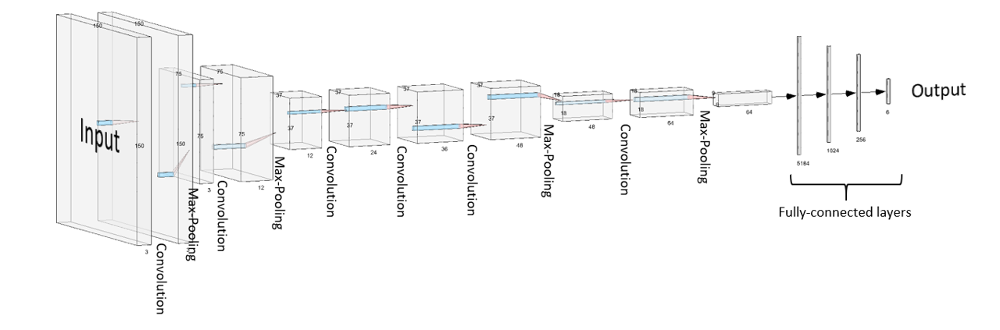

In [32]:
class Model3(nn.Module):
    def __init__(self, ninput=3, noutput=6):
        super().__init__()
        self.ninput = ninput
        self.conv1 = nn.Conv2d(in_channels=ninput, out_channels=3, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=3, out_channels=12, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels=12, out_channels=24, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(in_channels=24, out_channels=36, kernel_size=3, padding=1)
        self.conv5 = nn.Conv2d(in_channels=36, out_channels=48, kernel_size=3, padding=1)
        self.conv6 = nn.Conv2d(in_channels=48, out_channels=64, kernel_size=3, padding=1)
        
        self.linear1 = nn.Linear(in_features=64*9*9, out_features=1024)
        self.linear2 = nn.Linear(in_features=1024, out_features=256)
        self.out = nn.Linear(in_features=256, out_features=noutput)
        
    def forward(self, xb):
        # (1) input layer
        if self.ninput == 1: #If it is a grayscale image, not an RGB one
            xb = xb.unsqueeze(1)
        else:
            xb = xb

        # (2) hidden conv layer
        xb = self.conv1(xb) # 150 -> 150
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) # 150 -> 75

        # (3) hidden conv layer
        xb = self.conv2(xb) # 75 -> 75
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) # 75 -> 37
        
        # (4) hidden conv layer
        xb = self.conv3(xb) # 37 -> 37
        xb = F.relu(xb)
        
        # (5) hidden conv layer
        xb = self.conv4(xb) # 37 -> 37
        xb = F.relu(xb)
        
        # (6) hidden conv layer
        xb = self.conv5(xb) # 37 -> 37
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) # 37 -> 18
        
        # (7) hidden conv layer
        xb = self.conv6(xb) # 18 -> 18
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) # 9 -> 9
        
        

        # (8) hidden linear layer
        xb = xb.reshape(-1, 64*9*9)
        xb = self.linear1(xb)
        xb = F.relu(xb)

        # (9) hidden linear layer
        xb = self.linear2(xb)
        xb = F.relu(xb)

        # (10) output layer
        out = self.out(xb)

        return out

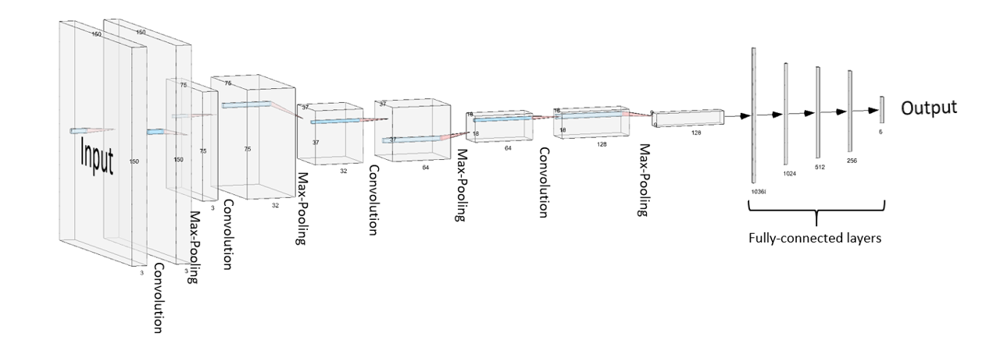

In [33]:
class Model4(nn.Module):
    def __init__(self, ninput=3, noutput=6):
        super().__init__()
        self.ninput = ninput
        self.conv1 = nn.Conv2d(in_channels=ninput, out_channels=3, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
        
        self.linear1 = nn.Linear(in_features=128*9*9, out_features=1024)
        self.linear2 = nn.Linear(in_features=1024, out_features=512)
        self.linear3 = nn.Linear(in_features=512, out_features=256)
        self.out = nn.Linear(in_features=256, out_features=noutput)

        
    def forward(self, xb):
        # (1) input layer
        if self.ninput == 1: #If it is a grayscale image, not an RGB one
            xb = xb.unsqueeze(1)
        else:
            xb = xb

        # (2) hidden conv layer
        xb = self.conv1(xb) #150 -> 150
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) #150 -> 75
        
        # (3) hidden conv layer
        xb = self.conv2(xb) #75 -> 75
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) #75 -> 37

        # (4) hidden conv layer
        xb = self.conv3(xb) #37 -> 37
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) #37 -> 18
        
        # (5) hidden conv layer
        xb = self.conv4(xb) #18 -> 18
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) #18 -> 9
        
        # (6) hidden linear layer
        xb = xb.reshape(-1, 128*9*9) #channel * h * w
        xb = self.linear1(xb)
        xb = F.relu(xb)

        # (7) hidden linear layer
        xb = self.linear2(xb)
        xb = F.relu(xb)
        
        # (8) hidden linear layer
        xb = self.linear3(xb)
        xb = F.relu(xb)

        # (9) output layer
        out = self.out(xb)
        return out

This model should be familiar to You, we used this model in one of our lessons.

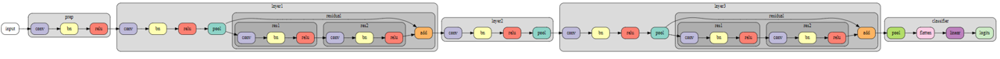

In [34]:
##############################################
#######Model from the lessons, ResNet9########

def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

class ImageClassificationBase(nn.Module):
    def training_step(self, batch):
        images, labels = batch 
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], last_lr: {:.5f}, train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['lrs'][-1], result['train_loss'], result['val_loss'], result['val_acc']))
        
        

class SimpleResidualBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=3, kernel_size=3, stride=1, padding=1)
        self.relu1 = nn.ReLU()
        self.conv2 = nn.Conv2d(in_channels=3, out_channels=3, kernel_size=3, stride=1, padding=1)
        self.relu2 = nn.ReLU()
        
    def forward(self, x):
        out = self.conv1(x)
        out = self.relu1(out)
        out = self.conv2(out)
        return self.relu2(out) + x # ReLU can be applied before or after adding the input
    
    
    
simple_resnet = to_device(SimpleResidualBlock(), device)

for images, labels in train_dl:
    out = simple_resnet(images)
    #print(out.shape)
    break
    
del simple_resnet, images, labels
torch.cuda.empty_cache()


def conv_block(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1), 
              nn.BatchNorm2d(out_channels), 
              nn.ReLU(inplace=True)]
    if pool: layers.append(nn.MaxPool2d(2))
    return nn.Sequential(*layers)

class ResNet9(ImageClassificationBase):
    def __init__(self, in_channels, num_classes):
        super().__init__()
        
        self.conv1 = conv_block(in_channels, 64)
        self.conv2 = conv_block(64, 128, pool=True)
        self.res1 = nn.Sequential(conv_block(128, 128), conv_block(128, 128))
        
        self.conv3 = conv_block(128, 256, pool=True)
        self.conv4 = conv_block(256, 512, pool=True)
        self.res2 = nn.Sequential(conv_block(512, 512), conv_block(512, 512))
        
        self.classifier = nn.Sequential(nn.MaxPool2d(18), 
                                        nn.Flatten(), 
                                        nn.Linear(512, num_classes))
        
    def forward(self, xb):
        out = self.conv1(xb)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        return out

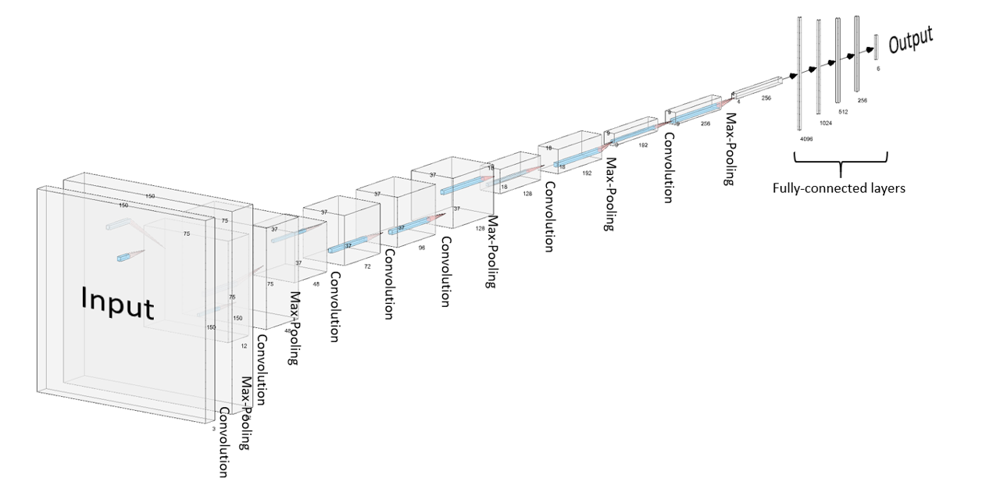

In [35]:
class Model5(nn.Module):
    def __init__(self, ninput=3, noutput=6):
        super().__init__()
        self.ninput = ninput
        self.conv1 = nn.Conv2d(in_channels=ninput, out_channels=12, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=12, out_channels=48, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels=48, out_channels=76, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(in_channels=76, out_channels=96, kernel_size=3, padding=1)
        self.conv5 = nn.Conv2d(in_channels=96, out_channels=128, kernel_size=3, padding=1)
        self.conv6 = nn.Conv2d(in_channels=128, out_channels=192, kernel_size=3, padding=1)
        self.conv7 = nn.Conv2d(in_channels=192, out_channels=256, kernel_size=3, padding=1)
        
        self.linear1 = nn.Linear(in_features=256*4*4, out_features=1024)
        self.linear2 = nn.Linear(in_features=1024, out_features=512)
        self.linear3 = nn.Linear(in_features=512, out_features=256)
        self.out = nn.Linear(in_features=256, out_features=noutput)

        
    def forward(self, xb):
        # (1) input layer
        if self.ninput == 1: #If it is a grayscale image, not an RGB one
            xb = xb.unsqueeze(1)
        else:
            xb = xb

        # (2) hidden conv layer
        xb = self.conv1(xb) #150 -> 150
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) #150 -> 75
        
        # (3) hidden conv layer
        xb = self.conv2(xb) #75 -> 75
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) #75 -> 37

        # (4) hidden conv layer
        xb = self.conv3(xb) #37 -> 37
        xb = F.relu(xb)
        
        # (5) hidden conv layer
        xb = self.conv4(xb) #37 -> 37
        xb = F.relu(xb)

        # (6) hidden conv layer
        xb = self.conv5(xb) #75 -> 75
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) #37 -> 18

        # (7) hidden conv layer
        xb = self.conv6(xb) #18 -> 18
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) #18 -> 9

        # (8) hidden conv layer
        xb = self.conv7(xb) #9 -> 9
        xb = F.relu(xb)
        xb = F.max_pool2d(xb, kernel_size=2, stride=2) #9 -> 4
        
        # (9) hidden linear layer
        xb = xb.reshape(-1, 256*4*4) #channel * h * w
        xb = self.linear1(xb)
        xb = F.relu(xb)

        # (10) hidden linear layer
        xb = self.linear2(xb)
        xb = F.relu(xb)
        
        # (11) hidden linear layer
        xb = self.linear3(xb)
        xb = F.relu(xb)

        # (12) output layer
        out = self.out(xb)
        return out

# **TRAINING**

I wanted to based on my project on the codes in the lessons as little as I could, so I wrote my own approach to the training method. I needed a function, that can numerate the correctly predicted images, the get_num_correct function does the trick for it. Important detail, it count the correct labels, and not the accuracy (it gives as quantity, and not quality).

In [36]:
#How many predictions are correct (gives quantity, not quality!)
def get_num_correct(preds, labels):
    return preds.argmax(dim=1).eq(labels).sum().item()

We can see, the training method asks for some parameters. These parameters are the model, we want to use (remember, previously I defined more networks); the number of epoch; the learning rate, which will specify the speed of the updates of the weight matrices, with modify the step size. Then we have to give the function a training and a related validation dataloader. Besides we have two optional parameters: the optimizer and loss function we want the process to use. For basic values I pickes the SGD (Stochastic gradient descent) as optimizer, and the default cost function is the cross-entropy.

Inside the function, first I print out the used model and optimizer. After that, before the training begins, the method calculates the loss and accuracy for the training and the validation set, then puts these values into their lists as their first element, and print them out as well.
Then we can start to train the model with the updates of the weight matrices. After every epoch there is a calculation for the actual metrics, which we store in the lists, and print it out too.

In [37]:
#Training process
#I tried to implement my own training block, it has some issues, 
#I will try to reduce them later on

def train(model, num_epochs, learning_rate, train_dl, val_dl, 
          opt_func = torch.optim.SGD, loss_fn = F.cross_entropy):

    torch.cuda.empty_cache()
    
    optimizer = opt_func(model.parameters(), lr = learning_rate)
    
    print("Used model:\n", model)
    print()
    print("Used optimization:\n", optimizer)
    print()
    
    with torch.no_grad():
        total_loss_val = 0
        total_correct_val = 0
        total_loss = 0
        total_correct = 0

        for batch in val_dl:   #For starter accuracy
            images, labels = batch
            preds = model(images)
            loss = loss_fn(preds, labels)
            total_loss_val += loss
            total_correct_val += get_num_correct(preds, labels)

        val_acc = []
        val_epoch = []
        val_loss = []
        val_acc.append(total_correct_val/val_size)
        val_epoch.append(0)
        val_loss.append(total_loss_val.item()/val_size)

        for batch in train_dl:   #For starter accuracy
            images, labels = batch
            preds = model(images)
            loss = loss_fn(preds, labels)
            total_loss += loss
            total_correct += get_num_correct(preds, labels)

        train_acc = []
        train_epoch = []
        train_loss = []
        train_acc.append(total_correct/train_size)
        train_epoch.append(0)
        train_loss.append(total_loss.item()/train_size)
    
    print()
    print("Before training:")
    print("\nTRAIN Loss: ", f'{(total_loss.item()/train_size):.5f}', 
          "\nTRAIN correct: ", total_correct, "/", train_size)
    print("\nVAL Loss: ", f'{(total_loss_val.item()/val_size):.5f}', 
          "\nVAL correct: ", total_correct_val, "/", val_size)
    print()    
    
    for epoch in range(num_epochs):
        total_loss = 0
        total_correct = 0
        total_loss_val = 0
        total_correct_val = 0
  
        model.train()
        for batch in train_dl:
            images, labels = batch
            preds = model(images)
            loss = loss_fn(preds, labels)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            total_loss += loss
            total_correct += get_num_correct(preds, labels)
        
        with torch.no_grad():
        
            model.eval()
            for batch in val_dl:
                images, labels = batch
                preds = model(images)
                loss = loss_fn(preds, labels)
                total_loss_val += loss
                total_correct_val += get_num_correct(preds, labels)
                    
        print("Epoch: ", epoch + 1)   
        print("TRAIN Loss: ", f'{((total_loss.item()/train_size)):.5f}', 
              "\nTRAIN correct: ", total_correct, "/", train_size)
        print("\nVAL Loss: ", f'{((total_loss_val.item()/val_size)):.5f}', 
              "\nVAL correct: ", total_correct_val, "/", val_size)
        print()       
        
        val_epoch.append(epoch+1)
        val_acc.append(total_correct_val/val_size)
        val_loss.append(total_loss_val.item()/val_size)      
        train_epoch.append(epoch+1)
        train_acc.append(total_correct/train_size)
        train_loss.append(total_loss.item()/train_size)
            
    print("TRAIN Accuracy: ", f'{(total_correct/train_size *100):.2f}', "%")
    print("VAL Accuracy: ", f'{(total_correct_val/val_size *100):.2f}', "%")
    print("\n\n\n") 
    
    return [val_epoch, val_loss, val_acc, train_epoch, train_loss, train_acc]

After the last epoch, when the procedure finishes, it returns with the loss and accurate lists for the training and validation sets, we followed through the method.

# **PROC.**

After we defined everything we needed, we can start the process. First, we substantiate a model on the GPU (the datasets are previously moved there), then we call the train function with the chosen arguments. I also used the %%time build-in function for timing, which is great for compare used models.

In [38]:
def combined_comp_datasets_acc(train_epoch, val_acc1, train_acc1, val_acc2, train_acc2, val_acc3, train_acc3, val_acc4, train_acc4, set1, set2, set3, set4):

    plt.figure(figsize=(20, 10))

    #PLOT ACCURACY
    plt.subplot(1, 2, 1)
    plt.grid(True)
    # First line
    plt.plot(train_epoch, val_acc1, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
    # Second line
    plt.plot(train_epoch, val_acc2, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
    # Third line   
    plt.plot(train_epoch, val_acc3, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
    # Forth line
    plt.plot(train_epoch, val_acc4, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c')
    
    # Title
    plt.title('Validation accuracy through epochs', fontsize=25)
    # Line labels
    plt.legend([set1, set2, set3, set4], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    


    #PLOT ACCURACY
    plt.subplot(1, 2, 2)
    plt.grid(True)
    # First line
    plt.plot(train_epoch, train_acc1, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
    # Second line
    plt.plot(train_epoch, train_acc2, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
    # Third line   
    plt.plot(train_epoch, train_acc3, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
    # Forth line
    plt.plot(train_epoch, train_acc4, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c')
    
    # Title
    plt.title('Train accuracy through epochs', fontsize=25)
    # Line labels
    plt.legend([set1, set2, set3, set4], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

In [39]:
def combined_comp_datasets_loss(train_epoch, val_loss1, train_loss1, val_loss2, train_loss2, val_loss3, train_loss3, val_loss4, train_loss4, set1, set2, set3, set4):

    plt.figure(figsize=(20, 10))

    #PLOT ACCURACY
    plt.subplot(1, 2, 1)
    plt.grid(True)
    # First line
    plt.plot(train_epoch, val_loss1, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
    # Second line
    plt.plot(train_epoch, val_loss2, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
    # Third line   
    plt.plot(train_epoch, val_loss3, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
    # Forth line
    plt.plot(train_epoch, val_loss4, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c')
    
    # Title
    plt.title('Validation loss through epochs', fontsize=25)
    # Line labels
    plt.legend([set1, set2, set3, set4], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Loss', fontsize=20);
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    


    #PLOT ACCURACY
    plt.subplot(1, 2, 2)
    plt.grid(True)
    # First line
    plt.plot(train_epoch, train_loss1, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
    # Second line
    plt.plot(train_epoch, train_loss2, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
    # Third line   
    plt.plot(train_epoch, train_loss3, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
    # Forth line
    plt.plot(train_epoch, train_loss4, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c')
    
    # Title
    plt.title('Train loss through epochs', fontsize=25)
    # Line labels
    plt.legend([set1, set2, set3, set4], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Loss', fontsize=20);
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

In [40]:
def comp_datasets_(train_epoch, train_loss1, train_loss2, train_loss3, train_loss4, set1, set2, set3, set4):

    plt.figure(figsize=(10, 10))

    #PLOT ACCURACY
    #plt.subplot(1, 2, 1)
    plt.grid(True)
    # First line
    plt.plot(train_epoch, train_loss1, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
    # Second line
    plt.plot(train_epoch, train_loss2, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
    # Third line   
    plt.plot(train_epoch, train_loss3, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
    # Forth line
    plt.plot(train_epoch, train_loss4, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c')
    
    # Title
    plt.title('Valodation accuracy through epochs', fontsize=25)
    # Line labels
    plt.legend([set1, set2, set3, set4], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

In [41]:
def comp_datasets(train_epoch, train_loss1, train_loss2, train_loss3, train_loss4, set1, set2, set3, set4):

    plt.figure(figsize=(10, 10))

    #PLOT ACCURACY
    #plt.subplot(1, 2, 1)
    plt.grid(True)
    # First line
    plt.plot(train_epoch, train_loss1, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
    # Second line
    plt.plot(train_epoch, train_loss2, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
    # Third line   
    plt.plot(train_epoch, train_loss3, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
    # Forth line
    plt.plot(train_epoch, train_loss4, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c')
    
    # Title
    plt.title('Training accuracy through epochs', fontsize=25)
    # Line labels
    plt.legend([set1, set2, set3, set4], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

In [42]:
model_gray0 = to_device(Model0_gray(), device)
model_rgb0 = to_device(Model0(), device)
model_norm0 = to_device(Model0(), device)
model_mod0 = to_device(Model0(), device)

In [43]:
%%time
[val_epoch_gray0, val_loss_gray0, val_acc_gray0, train_epoch_gray0, train_loss_gray0, train_acc_gray0] = train(model_gray0, 20, 0.0001, gray_train_dl, gray_val_dl, torch.optim.Adam)

Used model:
 Model0_gray(
  (linear1): Linear(in_features=22500, out_features=4096, bias=True)
  (linear2): Linear(in_features=4096, out_features=512, bias=True)
  (linear3): Linear(in_features=512, out_features=64, bias=True)
  (linear4): Linear(in_features=64, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02810 
TRAIN correct:  1770 / 11228

VAL Loss:  0.02812 
VAL correct:  402 / 2806

Epoch:  1
TRAIN Loss:  0.02586 
TRAIN correct:  3396 / 11228

VAL Loss:  0.02506 
VAL correct:  928 / 2806

Epoch:  2
TRAIN Loss:  0.02453 
TRAIN correct:  3968 / 11228

VAL Loss:  0.02419 
VAL correct:  1054 / 2806

Epoch:  3
TRAIN Loss:  0.02382 
TRAIN correct:  4179 / 11228

VAL Loss:  0.02378 
VAL correct:  1030 / 2806

Epoch:  4
TRAIN Loss:  0.02342 
TRAIN correct:  4305 / 11228

VAL Loss:  0.02366 
VAL correct:  1075 / 2806

Epoch:  5
TRAI

In [44]:
%%time
[val_epoch_rgb0, val_loss_rgb0, val_acc_rgb0, train_epoch_rgb0, train_loss_rgb0, train_acc_rgb0] = train(model_rgb0, 20, 0.0001, train_dl, val_dl, torch.optim.Adam)

Used model:
 Model0(
  (linear1): Linear(in_features=67500, out_features=4096, bias=True)
  (linear2): Linear(in_features=4096, out_features=512, bias=True)
  (linear3): Linear(in_features=512, out_features=64, bias=True)
  (linear4): Linear(in_features=64, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02812 
TRAIN correct:  1896 / 11228

VAL Loss:  0.02816 
VAL correct:  485 / 2806

Epoch:  1
TRAIN Loss:  0.02270 
TRAIN correct:  4885 / 11228

VAL Loss:  0.02068 
VAL correct:  1417 / 2806

Epoch:  2
TRAIN Loss:  0.01988 
TRAIN correct:  5806 / 11228

VAL Loss:  0.01907 
VAL correct:  1502 / 2806

Epoch:  3
TRAIN Loss:  0.01885 
TRAIN correct:  6063 / 11228

VAL Loss:  0.01846 
VAL correct:  1541 / 2806

Epoch:  4
TRAIN Loss:  0.01783 
TRAIN correct:  6396 / 11228

VAL Loss:  0.01924 
VAL correct:  1506 / 2806

Epoch:  5
TRAIN Lo

In [45]:
%%time
[val_epoch_norm0, val_loss_norm0, val_acc_norm0, train_epoch_norm0, train_loss_norm0, train_acc_norm0] = train(model_norm0, 20, 0.0001, norm_train_dl, norm_val_dl, torch.optim.Adam)

Used model:
 Model0(
  (linear1): Linear(in_features=67500, out_features=4096, bias=True)
  (linear2): Linear(in_features=4096, out_features=512, bias=True)
  (linear3): Linear(in_features=512, out_features=64, bias=True)
  (linear4): Linear(in_features=64, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02826 
TRAIN correct:  1361 / 11228

VAL Loss:  0.02829 
VAL correct:  289 / 2806

Epoch:  1
TRAIN Loss:  0.01957 
TRAIN correct:  5823 / 11228

VAL Loss:  0.01774 
VAL correct:  1622 / 2806

Epoch:  2
TRAIN Loss:  0.01597 
TRAIN correct:  6892 / 11228

VAL Loss:  0.01748 
VAL correct:  1614 / 2806

Epoch:  3
TRAIN Loss:  0.01353 
TRAIN correct:  7607 / 11228

VAL Loss:  0.01674 
VAL correct:  1716 / 2806

Epoch:  4
TRAIN Loss:  0.01120 
TRAIN correct:  8287 / 11228

VAL Loss:  0.01739 
VAL correct:  1718 / 2806

Epoch:  5
TRAIN Lo

In [46]:
%%time
[val_epoch_mod0, val_loss_mod0, val_acc_mod0, train_epoch_mod0, train_loss_mod0, train_acc_mod0] = train(model_mod0, 20, 0.0001, mod_train_dl, norm_val_dl, torch.optim.Adam)

Used model:
 Model0(
  (linear1): Linear(in_features=67500, out_features=4096, bias=True)
  (linear2): Linear(in_features=4096, out_features=512, bias=True)
  (linear3): Linear(in_features=512, out_features=64, bias=True)
  (linear4): Linear(in_features=64, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02813 
TRAIN correct:  1792 / 11228

VAL Loss:  0.02819 
VAL correct:  410 / 2806

Epoch:  1
TRAIN Loss:  0.02026 
TRAIN correct:  5596 / 11228

VAL Loss:  0.01851 
VAL correct:  1510 / 2806

Epoch:  2
TRAIN Loss:  0.01794 
TRAIN correct:  6322 / 11228

VAL Loss:  0.01765 
VAL correct:  1618 / 2806

Epoch:  3
TRAIN Loss:  0.01710 
TRAIN correct:  6519 / 11228

VAL Loss:  0.01661 
VAL correct:  1651 / 2806

Epoch:  4
TRAIN Loss:  0.01643 
TRAIN correct:  6778 / 11228

VAL Loss:  0.01594 
VAL correct:  1742 / 2806

Epoch:  5
TRAIN Lo

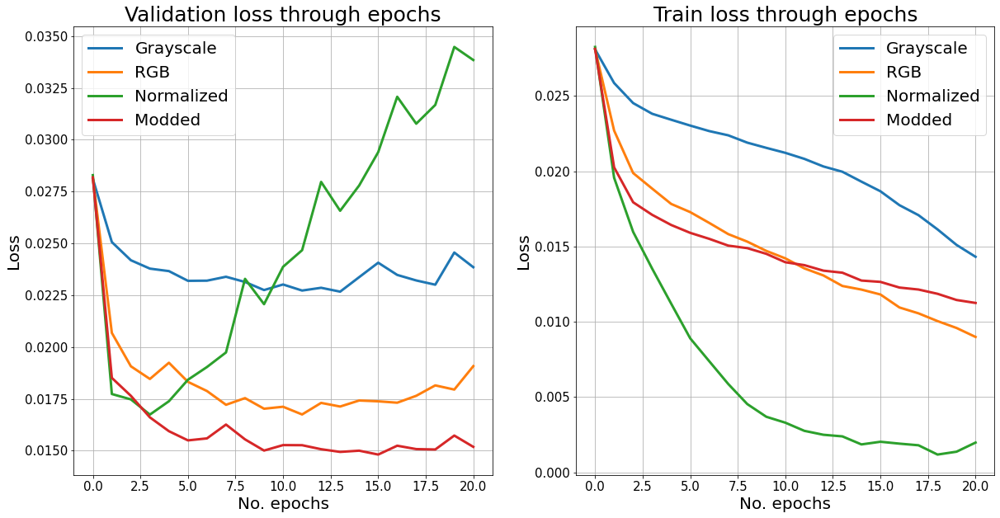

In [47]:
combined_comp_datasets_loss(val_epoch_gray0, val_loss_gray0, train_loss_gray0, val_loss_rgb0, train_loss_rgb0, val_loss_norm0, train_loss_norm0, val_loss_mod0, train_loss_mod0, 
                            'Grayscale', 'RGB', 'Normalized', 'Modded')

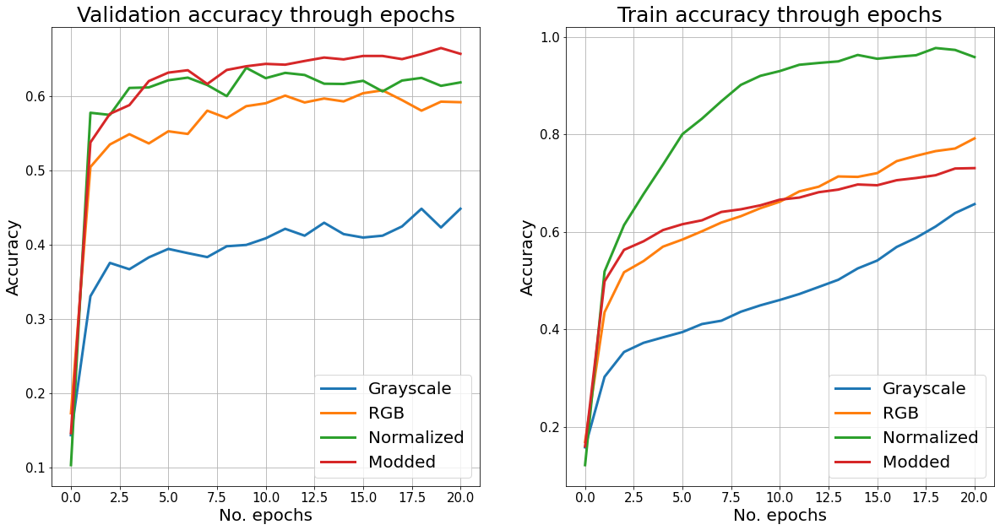

In [48]:
combined_comp_datasets_acc(val_epoch_gray0, val_acc_gray0, train_acc_gray0, val_acc_rgb0, train_acc_rgb0, val_acc_norm0, train_acc_norm0, val_acc_mod0, train_acc_mod0, 
                           'Grayscale', 'RGB', 'Normalized', 'Modded')

In [49]:
print("MODEL 0")
#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in gray_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_gray0(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("GRAY: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_gray0 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_rgb0(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("RGB: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_rgb0 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in norm_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_norm0(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("NORM: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_norm0 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in norm_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_mod0(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("MOD: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%") 
ACC_mod0 = (corr/test_size * 100)

MODEL 0
Accuracy on the test set: 
GRAY:  1283 /  3000 	 42.77 %
Accuracy on the test set: 
RGB:  1741 /  3000 	 58.03 %
Accuracy on the test set: 
NORM:  1804 /  3000 	 60.13 %
Accuracy on the test set: 
MOD:  1906 /  3000 	 63.53 %


In [50]:
model_gray1 = to_device(Model1(1,6), device)
model_rgb1 = to_device(Model1(3,6), device)
model_norm1 = to_device(Model1(3,6), device)
model_mod1 = to_device(Model1(3,6), device)

In [51]:
%%time
[val_epoch_gray1, val_loss_gray1, val_acc_gray1, train_epoch_gray1, train_loss_gray1, train_acc_gray1] = train(model_gray1, 20, 0.0001, gray_train_dl, gray_val_dl, torch.optim.Adam)

Used model:
 Model1(
  (conv1): Conv2d(1, 200, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(200, 180, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(180, 180, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(180, 140, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(140, 100, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(100, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=1800, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02809 
TRAIN correct:  1826 / 11228

VAL Loss:  0.02809 
VAL correct:  445 / 2806

Epoch:  1
TRAIN Loss:  0.02034 
TRAIN correct:  5332

In [52]:
%%time
[val_epoch_rgb1, val_loss_rgb1, val_acc_rgb1, train_epoch_rgb1, train_loss_rgb1, train_acc_rgb1] = train(model_rgb1, 20, 0.0001, train_dl, val_dl, torch.optim.Adam)

Used model:
 Model1(
  (conv1): Conv2d(3, 200, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(200, 180, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(180, 180, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(180, 140, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(140, 100, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(100, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=1800, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02810 
TRAIN correct:  1826 / 11228

VAL Loss:  0.02812 
VAL correct:  445 / 2806

Epoch:  1
TRAIN Loss:  0.01911 
TRAIN correct:  5646

In [53]:
%%time
[val_epoch_norm1, val_loss_norm1, val_acc_norm1, train_epoch_norm1, train_loss_norm1, train_acc_norm1] = train(model_norm1, 20, 0.0001, norm_train_dl, norm_val_dl, torch.optim.Adam)

Used model:
 Model1(
  (conv1): Conv2d(3, 200, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(200, 180, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(180, 180, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(180, 140, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(140, 100, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(100, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=1800, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02809 
TRAIN correct:  1826 / 11228

VAL Loss:  0.02810 
VAL correct:  445 / 2806

Epoch:  1
TRAIN Loss:  0.01855 
TRAIN correct:  5846

In [54]:
%%time
[val_epoch_mod1, val_loss_mod1, val_acc_mod1, train_epoch_mod1, train_loss_mod1, train_acc_mod1] = train(model_mod1, 20, 0.0001, mod_train_dl, norm_val_dl, torch.optim.Adam)

Used model:
 Model1(
  (conv1): Conv2d(3, 200, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(200, 180, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(180, 180, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(180, 140, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(140, 100, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(100, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=1800, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02808 
TRAIN correct:  1897 / 11228

VAL Loss:  0.02808 
VAL correct:  485 / 2806

Epoch:  1
TRAIN Loss:  0.01863 
TRAIN correct:  5911

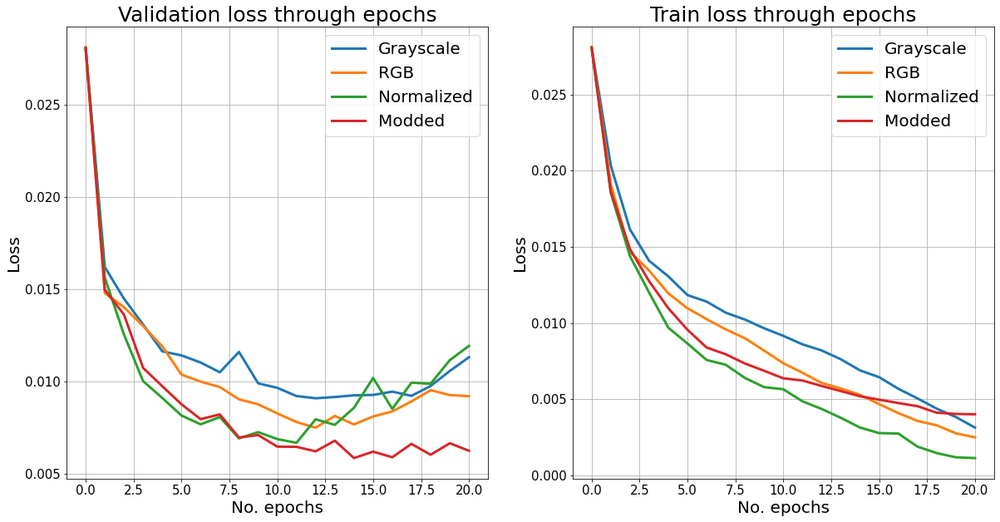

In [55]:
combined_comp_datasets_loss(val_epoch_gray1, val_loss_gray1, train_loss_gray1, val_loss_rgb1, train_loss_rgb1, val_loss_norm1, train_loss_norm1, val_loss_mod1, train_loss_mod1, 
                            'Grayscale', 'RGB', 'Normalized', 'Modded')

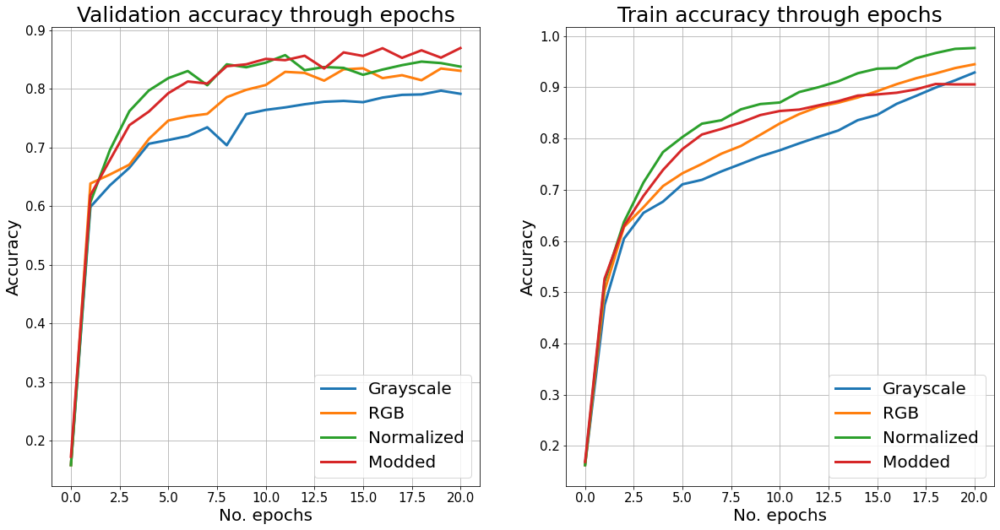

In [56]:
combined_comp_datasets_acc(val_epoch_gray1, val_acc_gray1, train_acc_gray1, val_acc_rgb1, train_acc_rgb1, val_acc_norm1, train_acc_norm1, val_acc_mod1, train_acc_mod1, 
                           'Grayscale', 'RGB', 'Normalized', 'Modded')

In [57]:
print("MODEL 1")
#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in gray_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_gray1(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("GRAY: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_gray1 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_rgb1(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("RGB: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_rgb1 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in norm_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_norm1(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("NORM: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_norm1 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in norm_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_mod1(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("MOD: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%") 
ACC_mod1 = (corr/test_size * 100)

MODEL 1
Accuracy on the test set: 
GRAY:  2355 /  3000 	 78.50 %
Accuracy on the test set: 
RGB:  2472 /  3000 	 82.40 %
Accuracy on the test set: 
NORM:  2512 /  3000 	 83.73 %
Accuracy on the test set: 
MOD:  2608 /  3000 	 86.93 %


In [58]:
model_gray2 = to_device(Model2(1,6), device)
model_rgb2 = to_device(Model2(3,6), device)
model_norm2 = to_device(Model2(3,6), device)
model_mod2 = to_device(Model2(3,6), device)

In [59]:
%%time
[val_epoch_gray2, val_loss_gray2, val_acc_gray2, train_epoch_gray2, train_loss_gray2, train_acc_gray2] = train(model_gray2, 20, 0.0001, gray_train_dl, gray_val_dl, torch.optim.Adam)

Used model:
 Model2(
  (conv1): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=1024, out_features=512, bias=True)
  (linear2): Linear(in_features=512, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02809 
TRAIN correct:  1938 / 11228

VAL Loss:  0.02810 
VAL correct:  466 / 2806

Epoch:  1
TRAIN Loss:  0.02377 
TRAIN correct:  4009 / 11228

VAL Loss:  0.01963 
VAL correct:  1390 / 2806

Epoch:  2
TRAIN Loss:  0.01868 


In [60]:
%%time
[val_epoch_rgb2, val_loss_rgb2, val_acc_rgb2, train_epoch_rgb2, train_loss_rgb2, train_acc_rgb2] = train(model_rgb2, 20, 0.0001, train_dl, val_dl, torch.optim.Adam)

Used model:
 Model2(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=1024, out_features=512, bias=True)
  (linear2): Linear(in_features=512, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02810 
TRAIN correct:  1826 / 11228

VAL Loss:  0.02812 
VAL correct:  445 / 2806

Epoch:  1
TRAIN Loss:  0.02268 
TRAIN correct:  4550 / 11228

VAL Loss:  0.01842 
VAL correct:  1505 / 2806

Epoch:  2
TRAIN Loss:  0.01778 


In [61]:
%%time
[val_epoch_norm2, val_loss_norm2, val_acc_norm2, train_epoch_norm2, train_loss_norm2, train_acc_norm2] = train(model_norm2, 20, 0.0001, norm_train_dl, norm_val_dl, torch.optim.Adam)

Used model:
 Model2(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=1024, out_features=512, bias=True)
  (linear2): Linear(in_features=512, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02808 
TRAIN correct:  1897 / 11228

VAL Loss:  0.02807 
VAL correct:  485 / 2806

Epoch:  1
TRAIN Loss:  0.02087 
TRAIN correct:  5163 / 11228

VAL Loss:  0.01751 
VAL correct:  1564 / 2806

Epoch:  2
TRAIN Loss:  0.01602 


In [62]:
%%time
[val_epoch_mod2, val_loss_mod2, val_acc_mod2, train_epoch_mod2, train_loss_mod2, train_acc_mod2] = train(model_mod2, 20, 0.0001, mod_train_dl, norm_val_dl, torch.optim.Adam)

Used model:
 Model2(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=1024, out_features=512, bias=True)
  (linear2): Linear(in_features=512, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02812 
TRAIN correct:  1811 / 11228

VAL Loss:  0.02812 
VAL correct:  463 / 2806

Epoch:  1
TRAIN Loss:  0.02098 
TRAIN correct:  5118 / 11228

VAL Loss:  0.01688 
VAL correct:  1615 / 2806

Epoch:  2
TRAIN Loss:  0.01657 


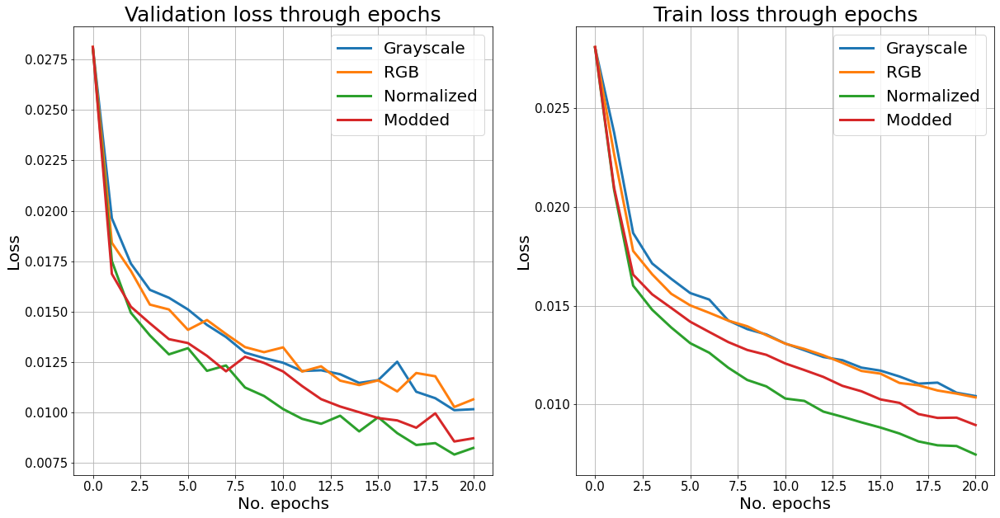

In [63]:
combined_comp_datasets_loss(val_epoch_gray2, val_loss_gray2, train_loss_gray2, val_loss_rgb2, train_loss_rgb2, val_loss_norm2, train_loss_norm2, val_loss_mod2, train_loss_mod2, 
                            'Grayscale', 'RGB', 'Normalized', 'Modded')

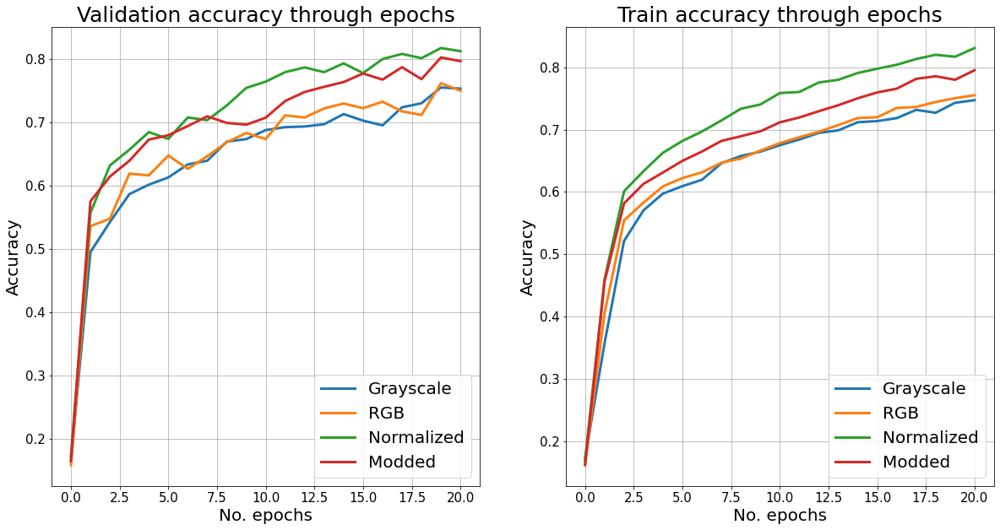

In [64]:
combined_comp_datasets_acc(val_epoch_gray2, val_acc_gray2, train_acc_gray2, val_acc_rgb2, train_acc_rgb2, val_acc_norm2, train_acc_norm2, val_acc_mod2, train_acc_mod2, 
                           'Grayscale', 'RGB', 'Normalized', 'Modded')

In [65]:
print("MODEL 2")
#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in gray_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_gray2(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("GRAY: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_gray2 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_rgb2(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("RGB: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_rgb2 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in norm_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_norm2(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("NORM: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_norm2 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in norm_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_mod2(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("MOD: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%") 
ACC_mod2 = (corr/test_size * 100)

MODEL 2
Accuracy on the test set: 
GRAY:  2197 /  3000 	 73.23 %
Accuracy on the test set: 
RGB:  2202 /  3000 	 73.40 %
Accuracy on the test set: 
NORM:  2404 /  3000 	 80.13 %
Accuracy on the test set: 
MOD:  2357 /  3000 	 78.57 %


In [66]:
model_gray3 = to_device(Model3(1,6), device)
model_rgb3 = to_device(Model3(3,6), device)
model_norm3 = to_device(Model3(3,6), device)
model_mod3 = to_device(Model3(3,6), device)

In [67]:
%%time
[val_epoch_gray3, val_loss_gray3, val_acc_gray3, train_epoch_gray3, train_loss_gray3, train_acc_gray3] = train(model_gray3, 20, 0.0001, gray_train_dl, gray_val_dl, torch.optim.Adam)

Used model:
 Model3(
  (conv1): Conv2d(1, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(3, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(12, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(24, 36, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(36, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(48, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=5184, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02811 
TRAIN correct:  1811 / 11228

VAL Loss:  0.02813 
VAL correct:  463 / 2806

Epoch:  1
TRAIN Loss:  0.02584 
TRAIN correct:  2958 / 11228

VA

In [68]:
%%time
[val_epoch_rgb3, val_loss_rgb3, val_acc_rgb3, train_epoch_rgb3, train_loss_rgb3, train_acc_rgb3] = train(model_rgb3, 20, 0.0001, train_dl, val_dl, torch.optim.Adam)

Used model:
 Model3(
  (conv1): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(3, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(12, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(24, 36, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(36, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(48, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=5184, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02808 
TRAIN correct:  1938 / 11228

VAL Loss:  0.02808 
VAL correct:  466 / 2806

Epoch:  1
TRAIN Loss:  0.02377 
TRAIN correct:  4321 / 11228

VA

In [69]:
%%time
[val_epoch_norm3, val_loss_norm3, val_acc_norm3, train_epoch_norm3, train_loss_norm3, train_acc_norm3] = train(model_norm3, 20, 0.0001, norm_train_dl, norm_val_dl, torch.optim.Adam)

Used model:
 Model3(
  (conv1): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(3, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(12, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(24, 36, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(36, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(48, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=5184, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02808 
TRAIN correct:  1938 / 11228

VAL Loss:  0.02810 
VAL correct:  466 / 2806

Epoch:  1
TRAIN Loss:  0.02176 
TRAIN correct:  5036 / 11228

VA

In [70]:
%%time
[val_epoch_mod3, val_loss_mod3, val_acc_mod3, train_epoch_mod3, train_loss_mod3, train_acc_mod3] = train(model_mod3, 20, 0.0001, mod_train_dl, norm_val_dl, torch.optim.Adam)

Used model:
 Model3(
  (conv1): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(3, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(12, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(24, 36, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(36, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(48, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=5184, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02810 
TRAIN correct:  1897 / 11228

VAL Loss:  0.02808 
VAL correct:  485 / 2806

Epoch:  1
TRAIN Loss:  0.02101 
TRAIN correct:  4981 / 11228

VA

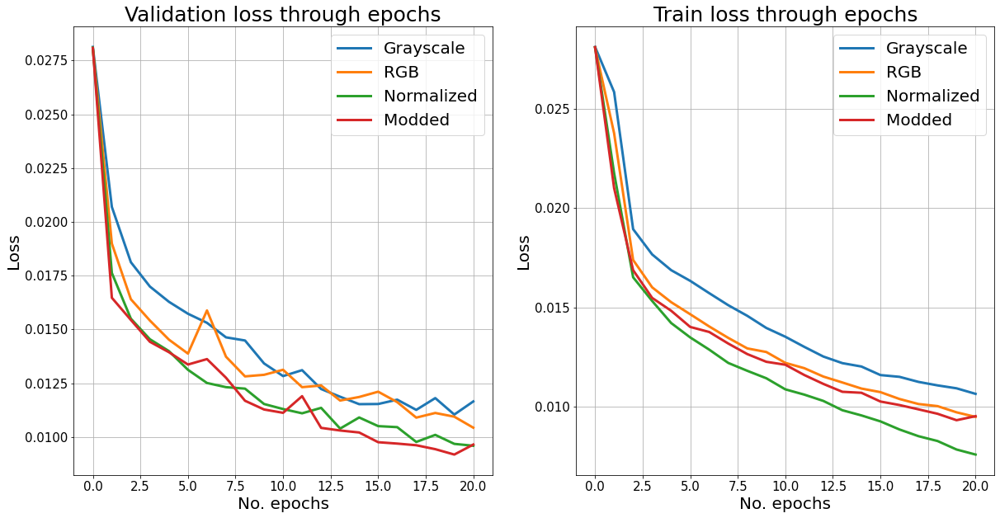

In [71]:
combined_comp_datasets_loss(val_epoch_gray3, val_loss_gray3, train_loss_gray3, val_loss_rgb3, train_loss_rgb3, val_loss_norm3, train_loss_norm3, val_loss_mod3, train_loss_mod3, 
                            'Grayscale', 'RGB', 'Normalized', 'Modded')

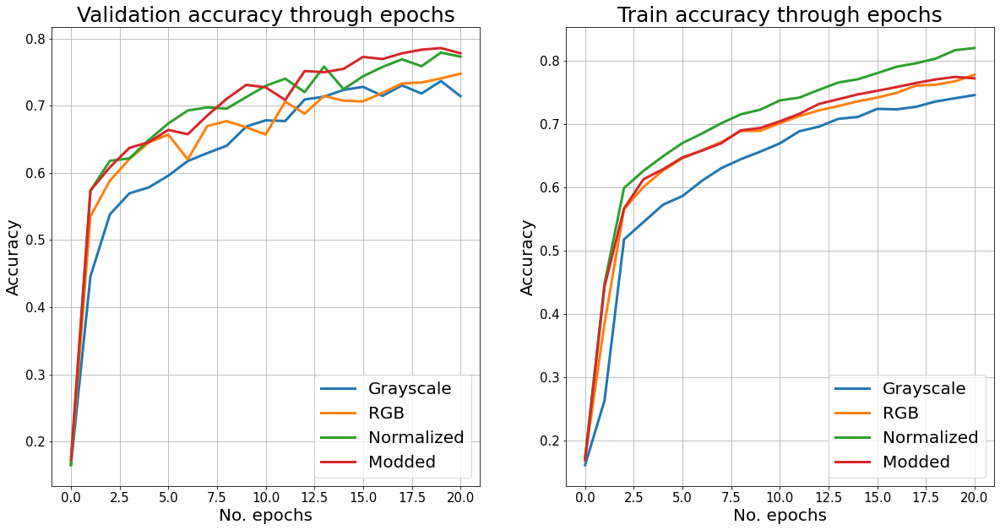

In [72]:
combined_comp_datasets_acc(val_epoch_gray3, val_acc_gray3, train_acc_gray3, val_acc_rgb3, train_acc_rgb3, val_acc_norm3, train_acc_norm3, val_acc_mod3, train_acc_mod3, 
                           'Grayscale', 'RGB', 'Normalized', 'Modded')

In [73]:
print("MODEL 3")
#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in gray_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_gray3(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("GRAY: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_gray3 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_rgb3(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("RGB: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_rgb3 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in norm_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_norm3(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("NORM: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_norm3 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in norm_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_mod3(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("MOD: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%") 
ACC_mod3 = (corr/test_size * 100)

MODEL 3
Accuracy on the test set: 
GRAY:  2079 /  3000 	 69.30 %
Accuracy on the test set: 
RGB:  2250 /  3000 	 75.00 %
Accuracy on the test set: 
NORM:  2282 /  3000 	 76.07 %
Accuracy on the test set: 
MOD:  2309 /  3000 	 76.97 %


In [74]:
model_gray4 = to_device(Model4(1,6), device)
model_rgb4 = to_device(Model4(3,6), device)
model_norm4 = to_device(Model4(3,6), device)
model_mod4 = to_device(Model4(3,6), device)

In [75]:
%%time
[val_epoch_gray4, val_loss_gray4, val_acc_gray4, train_epoch_gray4, train_loss_gray4, train_acc_gray4] = train(model_gray4, 20, 0.0001, gray_train_dl, gray_val_dl, torch.optim.Adam)

Used model:
 Model4(
  (conv1): Conv2d(1, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=10368, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=512, bias=True)
  (linear3): Linear(in_features=512, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02809 
TRAIN correct:  1938 / 11228

VAL Loss:  0.02809 
VAL correct:  466 / 2806

Epoch:  1
TRAIN Loss:  0.02395 
TRAIN correct:  4113 / 11228

VAL Loss:  0.01989 
VAL correct:  1394 / 2806

Epoch:  2
TRAIN Loss:  0.01846 
TRAIN cor

In [76]:
%%time
[val_epoch_rgb4, val_loss_rgb4, val_acc_rgb4, train_epoch_rgb4, train_loss_rgb4, train_acc_rgb4] = train(model_rgb4, 20, 0.0001, train_dl, val_dl, torch.optim.Adam)

Used model:
 Model4(
  (conv1): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=10368, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=512, bias=True)
  (linear3): Linear(in_features=512, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02810 
TRAIN correct:  1826 / 11228

VAL Loss:  0.02813 
VAL correct:  445 / 2806

Epoch:  1
TRAIN Loss:  0.02214 
TRAIN correct:  4615 / 11228

VAL Loss:  0.01847 
VAL correct:  1486 / 2806

Epoch:  2
TRAIN Loss:  0.01789 
TRAIN cor

In [77]:
%%time
[val_epoch_norm4, val_loss_norm4, val_acc_norm4, train_epoch_norm4, train_loss_norm4, train_acc_norm4] = train(model_norm4, 20, 0.0001, norm_train_dl, norm_val_dl, torch.optim.Adam)

Used model:
 Model4(
  (conv1): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=10368, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=512, bias=True)
  (linear3): Linear(in_features=512, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02810 
TRAIN correct:  1897 / 11228

VAL Loss:  0.02812 
VAL correct:  485 / 2806

Epoch:  1
TRAIN Loss:  0.02062 
TRAIN correct:  5365 / 11228

VAL Loss:  0.01692 
VAL correct:  1576 / 2806

Epoch:  2
TRAIN Loss:  0.01555 
TRAIN cor

In [78]:
%%time
[val_epoch_mod4, val_loss_mod4, val_acc_mod4, train_epoch_mod4, train_loss_mod4, train_acc_mod4] = train(model_mod4, 20, 0.0001, mod_train_dl, norm_val_dl, torch.optim.Adam)

Used model:
 Model4(
  (conv1): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=10368, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=512, bias=True)
  (linear3): Linear(in_features=512, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss:  0.02809 
TRAIN correct:  1972 / 11228

VAL Loss:  0.02807 
VAL correct:  540 / 2806

Epoch:  1
TRAIN Loss:  0.02086 
TRAIN correct:  5257 / 11228

VAL Loss:  0.01674 
VAL correct:  1628 / 2806

Epoch:  2
TRAIN Loss:  0.01626 
TRAIN cor

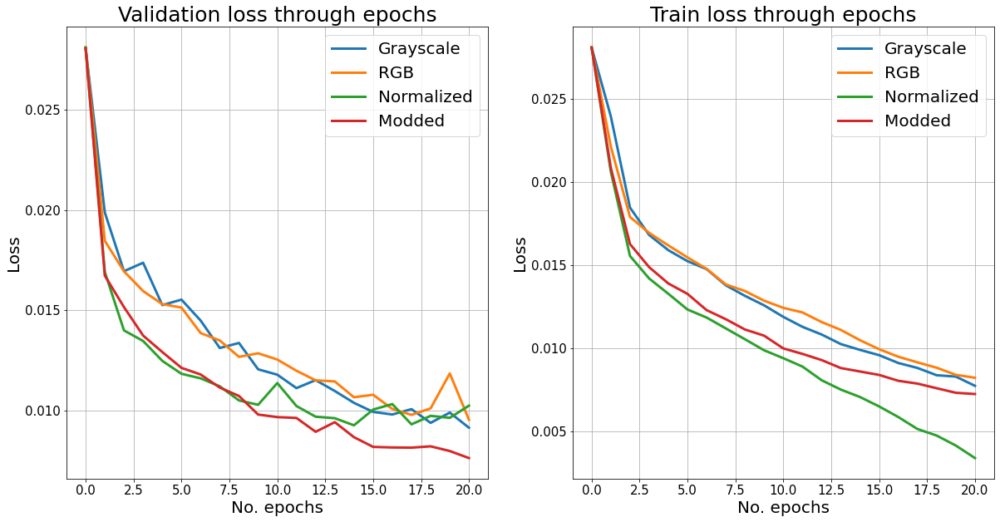

In [79]:
combined_comp_datasets_loss(val_epoch_gray4, val_loss_gray4, train_loss_gray4, val_loss_rgb4, train_loss_rgb4, val_loss_norm4, train_loss_norm4, val_loss_mod4, train_loss_mod4, 
                            'Grayscale', 'RGB', 'Normalized', 'Modded')

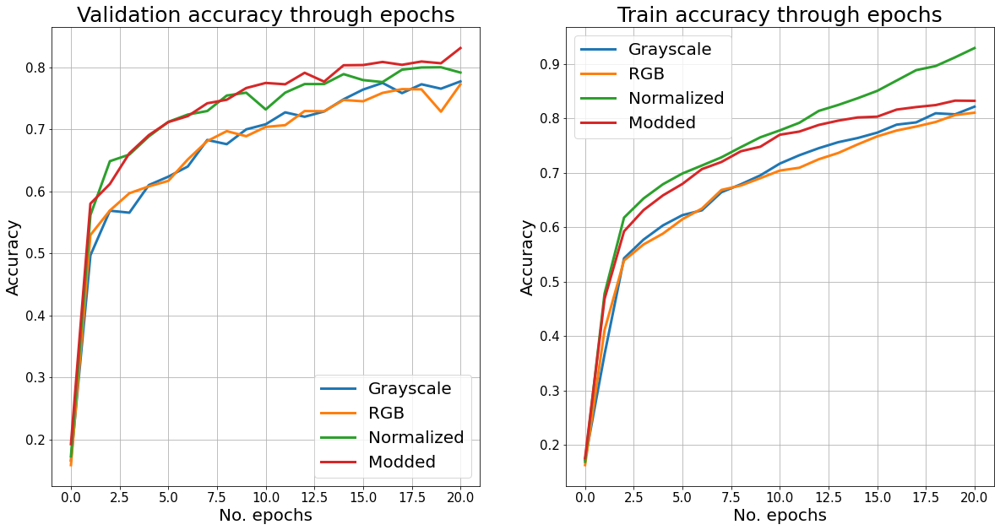

In [80]:
combined_comp_datasets_acc(val_epoch_gray4, val_acc_gray4, train_acc_gray4, val_acc_rgb4, train_acc_rgb4, val_acc_norm4, train_acc_norm4, val_acc_mod4, train_acc_mod4, 
                           'Grayscale', 'RGB', 'Normalized', 'Modded')

In [81]:
print("MODEL 4")
#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in gray_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_gray4(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("GRAY: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_gray4 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_rgb4(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("RGB: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_rgb4 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in norm_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_norm4(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("NORM: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_norm4 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in norm_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_mod4(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("MOD: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%") 
ACC_mod4 = (corr/test_size * 100)

MODEL 4
Accuracy on the test set: 
GRAY:  2322 /  3000 	 77.40 %
Accuracy on the test set: 
RGB:  2326 /  3000 	 77.53 %
Accuracy on the test set: 
NORM:  2349 /  3000 	 78.30 %
Accuracy on the test set: 
MOD:  2455 /  3000 	 81.83 %


In [82]:
model_gray5 = to_device(Model5(1,6), device)
model_rgb5 = to_device(Model5(3,6), device)
model_norm5 = to_device(Model5(3,6), device)
model_mod5 = to_device(Model5(3,6), device)

In [83]:
%%time
[val_epoch_gray5, val_loss_gray5, val_acc_gray5, train_epoch_gray5, train_loss_gray5, train_acc_gray5] = train(model_gray5, 20, 0.0001, gray_train_dl, gray_val_dl, torch.optim.Adam)

Used model:
 Model5(
  (conv1): Conv2d(1, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(12, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(48, 76, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(76, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(128, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv7): Conv2d(192, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=4096, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=512, bias=True)
  (linear3): Linear(in_features=512, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss: 

In [84]:
%%time
[val_epoch_rgb5, val_loss_rgb5, val_acc_rgb5, train_epoch_rgb5, train_loss_rgb5, train_acc_rgb5] = train(model_rgb5, 20, 0.0001, train_dl, val_dl, torch.optim.Adam)

Used model:
 Model5(
  (conv1): Conv2d(3, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(12, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(48, 76, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(76, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(128, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv7): Conv2d(192, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=4096, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=512, bias=True)
  (linear3): Linear(in_features=512, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss: 

In [85]:
%%time
[val_epoch_norm5, val_loss_norm5, val_acc_norm5, train_epoch_norm5, train_loss_norm5, train_acc_norm5] = train(model_norm5, 20, 0.0001, norm_train_dl, norm_val_dl, torch.optim.Adam)

Used model:
 Model5(
  (conv1): Conv2d(3, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(12, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(48, 76, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(76, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(128, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv7): Conv2d(192, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=4096, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=512, bias=True)
  (linear3): Linear(in_features=512, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss: 

In [86]:
%%time
[val_epoch_mod5, val_loss_mod5, val_acc_mod5, train_epoch_mod5, train_loss_mod5, train_acc_mod5] = train(model_mod5, 20, 0.0001, mod_train_dl, norm_val_dl, torch.optim.Adam)

Used model:
 Model5(
  (conv1): Conv2d(3, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(12, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(48, 76, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(76, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(128, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv7): Conv2d(192, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (linear1): Linear(in_features=4096, out_features=1024, bias=True)
  (linear2): Linear(in_features=1024, out_features=512, bias=True)
  (linear3): Linear(in_features=512, out_features=256, bias=True)
  (out): Linear(in_features=256, out_features=6, bias=True)
)

Used optimization:
 Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.0001
    weight_decay: 0
)


Before training:

TRAIN Loss: 

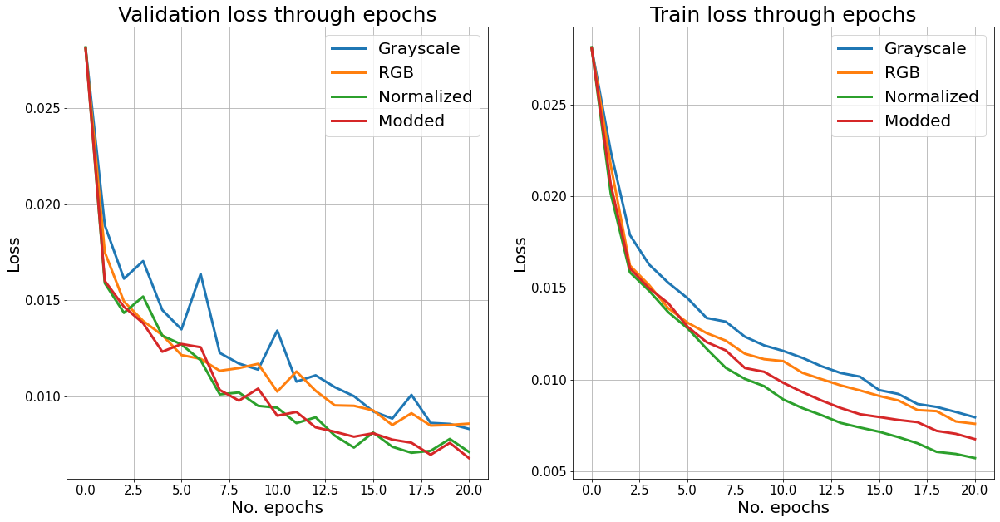

In [87]:
combined_comp_datasets_loss(val_epoch_gray5, val_loss_gray5, train_loss_gray5, val_loss_rgb5, train_loss_rgb5, val_loss_norm5, train_loss_norm5, val_loss_mod5, train_loss_mod5, 
                            'Grayscale', 'RGB', 'Normalized', 'Modded')

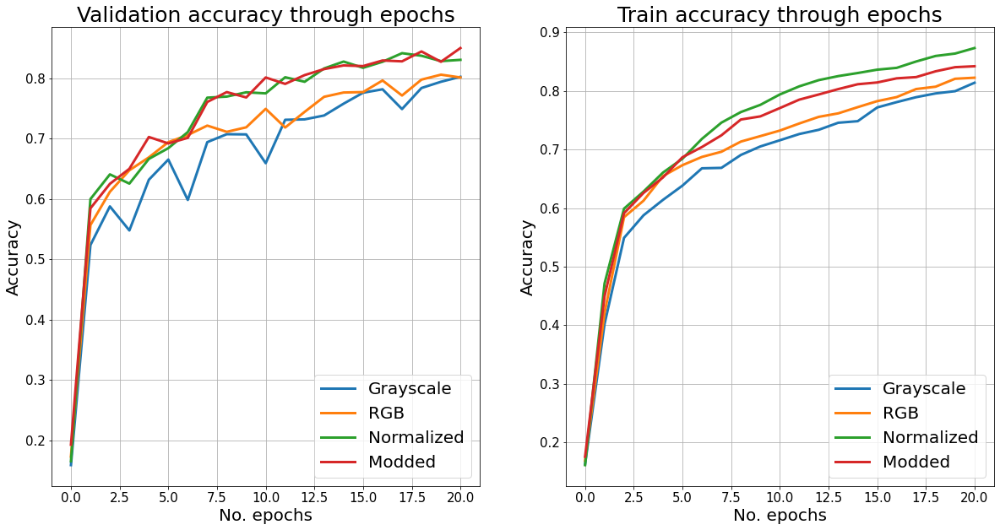

In [88]:
combined_comp_datasets_acc(val_epoch_gray5, val_acc_gray5, train_acc_gray5, val_acc_rgb5, train_acc_rgb5, val_acc_norm5, train_acc_norm5, val_acc_mod5, train_acc_mod5, 
                           'Grayscale', 'RGB', 'Normalized', 'Modded')

In [89]:
print("MODEL 5")
#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in gray_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_gray5(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("GRAY: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_gray5 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_rgb5(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("RGB: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_rgb5 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in norm_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_norm5(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("NORM: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_norm5 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in norm_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_mod5(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("MOD: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%") 
ACC_mod5 = (corr/test_size * 100)

MODEL 5
Accuracy on the test set: 
GRAY:  2353 /  3000 	 78.43 %
Accuracy on the test set: 
RGB:  2375 /  3000 	 79.17 %
Accuracy on the test set: 
NORM:  2512 /  3000 	 83.73 %
Accuracy on the test set: 
MOD:  2534 /  3000 	 84.47 %


In [90]:
"""model_gray6 = to_device(ResNet9(1,6), device)"""
model_rgb6 = to_device(ResNet9(3,6), device)
model_norm6 = to_device(ResNet9(3,6), device)
model_mod6 = to_device(ResNet9(3,6), device)

In [91]:
%%time
[val_epoch_rgb6, val_loss_rgb6, val_acc_rgb6, train_epoch_rgb6, train_loss_rgb6, train_acc_rgb6] = train(model_rgb6, 20, 0.0001, train_dl, val_dl, torch.optim.Adam)

Used model:
 ResNet9(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): Re

In [92]:
%%time
[val_epoch_norm6, val_loss_norm6, val_acc_norm6, train_epoch_norm6, train_loss_norm6, train_acc_norm6] = train(model_norm6, 20, 0.0001, norm_train_dl, norm_val_dl, torch.optim.Adam)

Used model:
 ResNet9(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): Re

In [93]:
%%time
[val_epoch_mod6, val_loss_mod6, val_acc_mod6, train_epoch_mod6, train_loss_mod6, train_acc_mod6] = train(model_mod6, 20, 0.0001, mod_train_dl, norm_val_dl, torch.optim.Adam)

Used model:
 ResNet9(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): Re

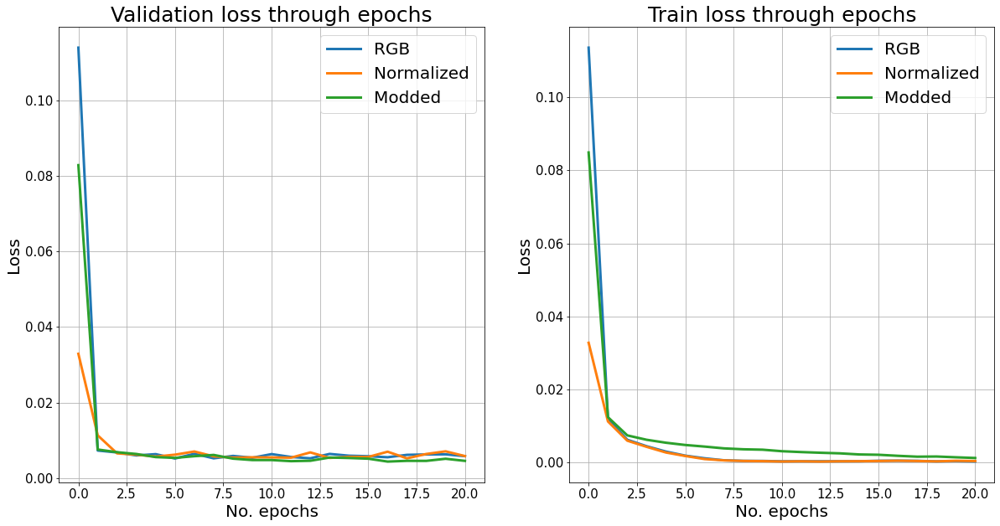

In [94]:
plt.figure(figsize=(20, 10))

#PLOT LOSS
plt.subplot(1, 2, 1)
plt.grid(True)
# First line
plt.plot(train_epoch_norm6, val_loss_rgb6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
# Second line
plt.plot(train_epoch_norm6, val_loss_norm6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g')
# Third line   
plt.plot(train_epoch_norm6, val_loss_mod6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r')
    
# Title
plt.title('Validation loss through epochs', fontsize=25)
# Line labels
plt.legend(['RGB', 'Normalized', 'Modded'], fontsize=20)
# Axis labels
plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Loss', fontsize=20);
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
    

#PLOT LOSS
plt.subplot(1, 2, 2)
plt.grid(True)
# First line
plt.plot(train_epoch_norm6, train_loss_rgb6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
# Second line
plt.plot(train_epoch_norm6, train_loss_norm6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g')
# Third line
plt.plot(train_epoch_norm6, train_loss_mod6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r')
    
# Title
plt.title('Train loss through epochs', fontsize=25)
# Line labels
plt.legend(['RGB', 'Normalized', 'Modded'], fontsize=20)
# Axis labels
plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Loss', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
print()

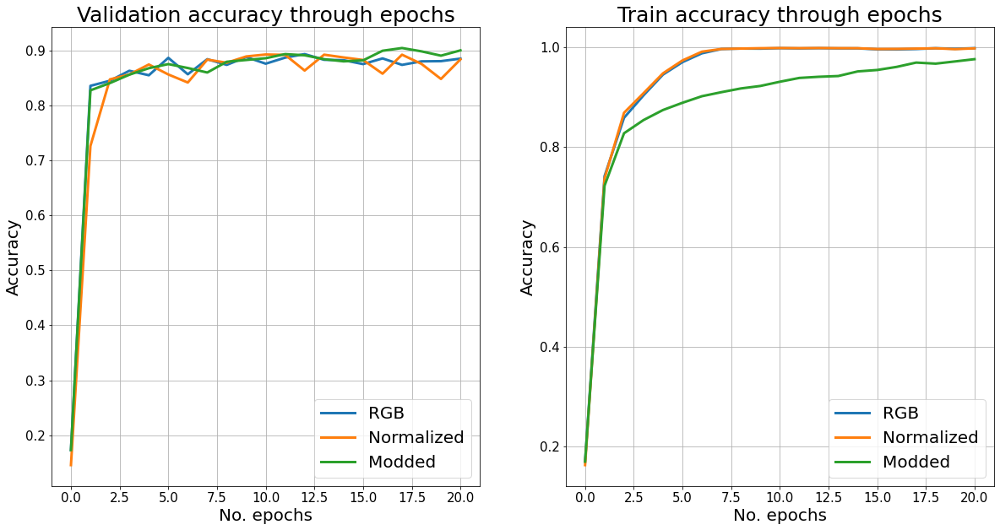

In [95]:
plt.figure(figsize=(20, 10))

#PLOT ACCURACY
plt.subplot(1, 2, 1)
plt.grid(True)
# First line
plt.plot(train_epoch_norm6, val_acc_rgb6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
# Second line
plt.plot(train_epoch_norm6, val_acc_norm6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g')
# Third line   
plt.plot(train_epoch_norm6, val_acc_mod6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r')

# Title
plt.title('Validation accuracy through epochs', fontsize=25)
# Line labels
plt.legend(['RGB', 'Normalized', 'Modded'], fontsize=20)
# Axis labels
plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
    


#PLOT ACCURACY
plt.subplot(1, 2, 2)
plt.grid(True)
# First line
plt.plot(train_epoch_norm6, train_acc_rgb6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
# Second line
plt.plot(train_epoch_norm6, train_acc_norm6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g')
# Third line   
plt.plot(train_epoch_norm6, train_acc_mod6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r')
   
# Title
plt.title('Train accuracy through epochs', fontsize=25)
# Line labels
plt.legend(['RGB', 'Normalized', 'Modded'], fontsize=20)
# Axis labels
plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
print()


In [96]:
print("MODEL 6")
"""#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in gray_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_gray6(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("GRAY: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_gray6 = (corr/test_size * 100)        """

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_rgb6(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("RGB: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_rgb6 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in norm_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_norm6(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("NORM: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")
ACC_norm6 = (corr/test_size * 100)        

#Accuracy on the test set
with torch.no_grad():
    corr = 0
    for batch in norm_test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model_mod6(images)
        corr += get_num_correct(preds, labels)

print("Accuracy on the test set: ")        
print("MOD: ", corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%") 
ACC_mod6 = (corr/test_size * 100)

MODEL 6
Accuracy on the test set: 
RGB:  2650 /  3000 	 88.33 %
Accuracy on the test set: 
NORM:  2637 /  3000 	 87.90 %
Accuracy on the test set: 
MOD:  2685 /  3000 	 89.50 %


We can be happy when we see high values for the accuracy (and low for the loss), but we don't want to count our chickens before they hatch. We should be sure, that the model performs well with nver seen data. That is why we have the following part. If this function gives us a value we satisfied with, we may move on, maybe try it out with real examples.

# **STATISTICAL VISUALIZATIONS**

First I created two functions. The first one is for plotting the accuracy and the loss as a function of the number of epochs with regards to the training and the validation values. The other function compare two (or third is optional) models' accuracies and losses through epochs.

In [97]:
def plot_loss_and_acc(val_epoch, val_acc, train_acc, val_loss, train_loss):
    
    plt.figure(figsize=(30, 10))


    #PLOT ACCURACY
    plt.subplot(1, 2, 1)
    plt.grid(True)
    # First line
    plt.plot(val_epoch, val_acc, linewidth=3, markersize=14, markeredgewidth=3, markeredgecolor='navy')
    # Second line
    plt.plot(val_epoch, train_acc, linewidth=3, markersize=14, markeredgewidth=3, markeredgecolor='blue');
    # Title
    plt.title('Accuracy through epochs', fontsize=25)
    # Line labels
    plt.legend(['Validation', 'Train'], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)


    #PLOT LOSS
    plt.subplot(1, 2, 2)
    plt.grid(True)
    # First line
    plt.plot(val_epoch, val_loss, linewidth=3, markersize=14, markeredgewidth=3, markeredgecolor='navy')
    # Second line
    plt.plot(val_epoch, train_loss, linewidth=3, markersize=14, markeredgewidth=3, markeredgecolor='blue');
    # Title
    plt.title('Loss through epochs', fontsize=25)
    # Line labels
    plt.legend(['Validation', 'Train'], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Loss', fontsize=20)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

In [98]:
def comp_models_val(val_epoch, val_acc0, val_loss0, model0, val_acc1, val_loss1, model1, val_acc2, val_loss2, model2, val_acc3, val_loss3, model3,
               val_acc4, val_loss4, model4, val_acc5, val_loss5, model5, val_acc6, val_loss6, model6):

    #COMPARISON OF MODELS (2 or 3)

    plt.figure(figsize=(30, 10))

    #PLOT ACCURACY
    plt.subplot(1, 2, 1)
    plt.grid(True)
    # Zeroth line
    plt.plot(val_epoch, val_acc0, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='k')
    # First line
    plt.plot(val_epoch, val_acc1, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
    # Second line
    plt.plot(val_epoch, val_acc2, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g')
    # Third line   
    plt.plot(val_epoch, val_acc3, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r')
    # Forth line
    plt.plot(val_epoch, val_acc4, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c')
    # Fifth line
    plt.plot(val_epoch, val_acc5, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='m')
    # Sixth line   
    plt.plot(val_epoch, val_acc6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='y')   
    # Title
    plt.title('Accuracy through epochs', fontsize=25)
    # Line labels
    plt.legend([model0, model1, model2, model3, model4, model5, model6], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)


    #PLOT LOSS
    plt.subplot(1, 2, 2)
    plt.grid(True)
    # Zeroth line
    plt.plot(val_epoch, val_loss0, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='k')
    # First line
    plt.plot(val_epoch, val_loss1, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
    # Second line
    plt.plot(val_epoch, val_loss2, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g')
    # Third line   
    plt.plot(val_epoch, val_loss3, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r')
    # Forth line
    plt.plot(val_epoch, val_loss4, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c')
    # Fifth line
    plt.plot(val_epoch, val_loss5, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='m')
    # Sixth line   
    plt.plot(val_epoch, val_loss6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='y')
    # Title
    plt.title('Loss through epochs', fontsize=25)
    # Line labels
    plt.legend([model0, model1, model2, model3, model4, model5, model6], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Loss', fontsize=20);
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

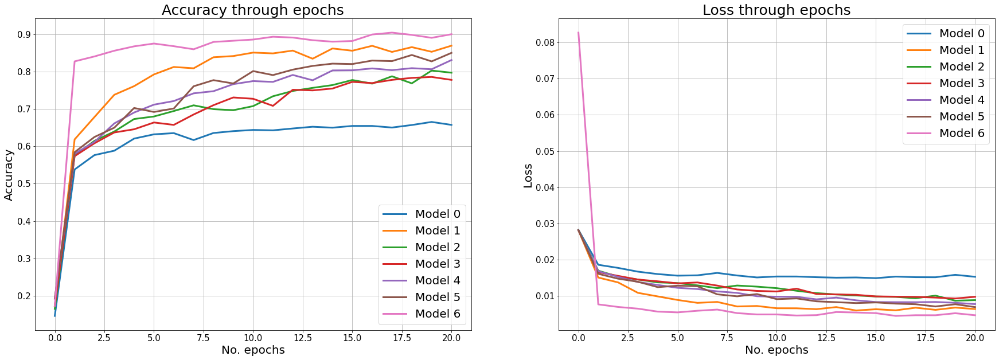

In [99]:
comp_models_val(val_epoch_mod0, val_acc_mod0, val_loss_mod0, 'Model 0', val_acc_mod1, val_loss_mod1, 'Model 1', val_acc_mod2, val_loss_mod2, 'Model 2', val_acc_mod3, val_loss_mod3, 'Model 3',
               val_acc_mod4, val_loss_mod4, 'Model 4', val_acc_mod5, val_loss_mod5, 'Model 5', val_acc_mod6, val_loss_mod6, 'Model 6')

In [100]:
def comp_models_train(val_epoch, val_acc0, val_loss0, model0, val_acc1, val_loss1, model1, val_acc2, val_loss2, model2, val_acc3, val_loss3, model3,
               val_acc4, val_loss4, model4, val_acc5, val_loss5, model5, val_acc6, val_loss6, model6):

    #COMPARISON OF MODELS (2 or 3)

    plt.figure(figsize=(30, 10))

    #PLOT ACCURACY
    plt.subplot(1, 2, 1)
    plt.grid(True)
    # Zeroth line
    plt.plot(val_epoch, val_acc0, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='k')
    # First line
    plt.plot(val_epoch, val_acc1, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
    # Second line
    plt.plot(val_epoch, val_acc2, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g')
    # Third line   
    plt.plot(val_epoch, val_acc3, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r')
    # Forth line
    plt.plot(val_epoch, val_acc4, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c')
    # Fifth line
    plt.plot(val_epoch, val_acc5, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='m')
    # Sixth line   
    plt.plot(val_epoch, val_acc6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='y')   
    # Title
    plt.title('Accuracy through epochs', fontsize=25)
    # Line labels
    plt.legend([model0, model1, model2, model3, model4, model5, model6], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)


    #PLOT LOSS
    plt.subplot(1, 2, 2)
    plt.grid(True)
    # Zeroth line
    plt.plot(val_epoch, val_loss0, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='k')
    # First line
    plt.plot(val_epoch, val_loss1, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
    # Second line
    plt.plot(val_epoch, val_loss2, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g')
    # Third line   
    plt.plot(val_epoch, val_loss3, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r')
    # Forth line
    plt.plot(val_epoch, val_loss4, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c')
    # Fifth line
    plt.plot(val_epoch, val_loss5, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='m')
    # Sixth line   
    plt.plot(val_epoch, val_loss6, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='y')
    # Title
    plt.title('Loss through epochs', fontsize=25)
    # Line labels
    plt.legend([model0, model1, model2, model3, model4, model5, model6], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Loss', fontsize=20);
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

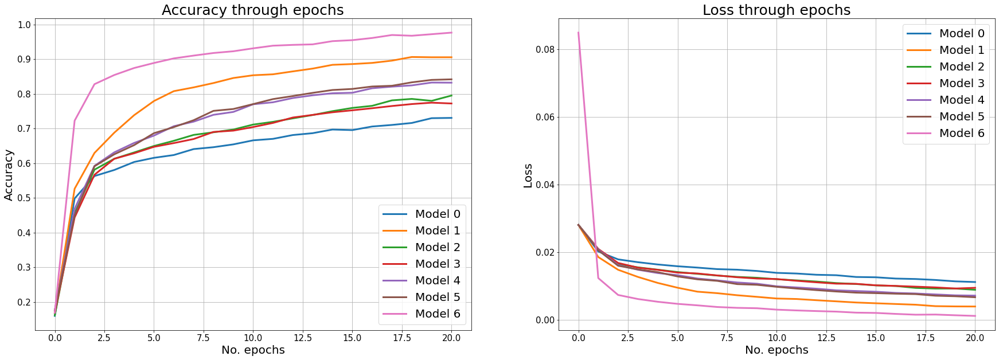

In [101]:
comp_models_train(train_epoch_mod0, train_acc_mod0, train_loss_mod0, 'Model 0', train_acc_mod1, train_loss_mod1, 'Model 1', train_acc_mod2, train_loss_mod2, 'Model 2', train_acc_mod3, train_loss_mod3, 'Model 3',
               train_acc_mod4, train_loss_mod4, 'Model 4', train_acc_mod5, train_loss_mod5, 'Model 5', train_acc_mod6, train_loss_mod6, 'Model 6')

In [102]:
def comp_datasets(train_epoch, train_loss1, train_loss2, train_loss3, train_loss4, set1, set2, set3, set4):

    plt.figure(figsize=(10, 10))

    #PLOT ACCURACY
    #plt.subplot(1, 2, 1)
    plt.grid(True)
    # First line
    plt.plot(train_epoch, train_loss1, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
    # Second line
    plt.plot(train_epoch, train_loss2, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
    # Third line   
    plt.plot(train_epoch, train_loss3, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
    # Forth line
    plt.plot(train_epoch, train_loss4, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c')
    
    # Title
    plt.title('Training accuracy through epochs', fontsize=25)
    # Line labels
    plt.legend([set1, set2, set3, set4], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

In [103]:
def comp_datasets2(train_epoch, train_loss1, train_loss2, train_loss3, set1, set2, set3):

    plt.figure(figsize=(10, 10))

    #PLOT ACCURACY
    #plt.subplot(1, 2, 1)
    plt.grid(True)
    # First line
    plt.plot(train_epoch, train_loss1, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
    # Second line
    plt.plot(train_epoch, train_loss2, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
    # Third line   
    plt.plot(train_epoch, train_loss3, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
    
    # Title
    plt.title('Training accuracy through epochs', fontsize=25)
    # Line labels
    plt.legend([set1, set2, set3], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

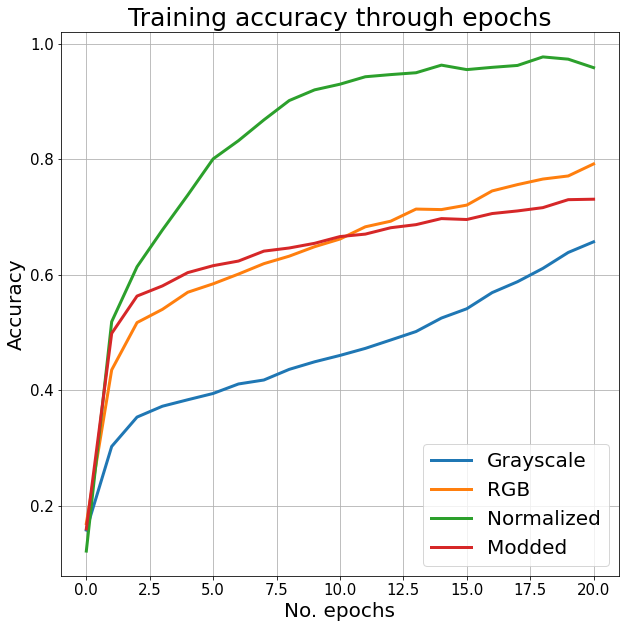

In [104]:
comp_datasets(train_epoch_rgb0, train_acc_gray0, train_acc_rgb0, train_acc_norm0, train_acc_mod0, 'Grayscale', 'RGB', 'Normalized', 'Modded')

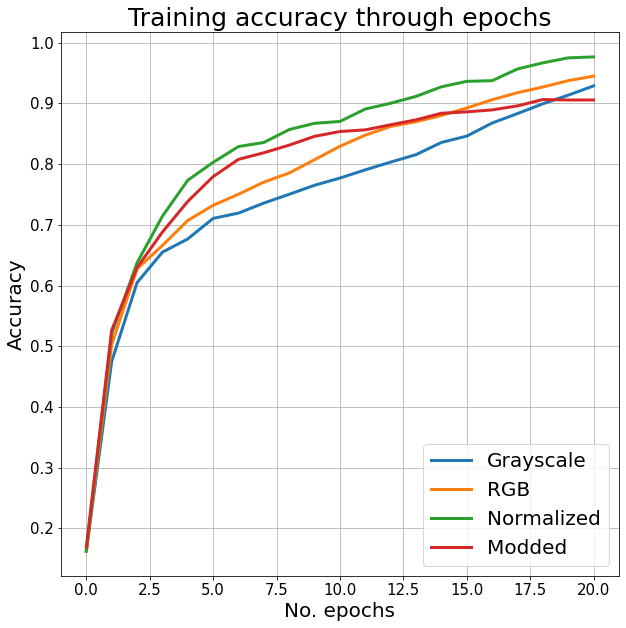

In [105]:
comp_datasets(train_epoch_rgb1, train_acc_gray1, train_acc_rgb1, train_acc_norm1, train_acc_mod1, 'Grayscale', 'RGB', 'Normalized', 'Modded')

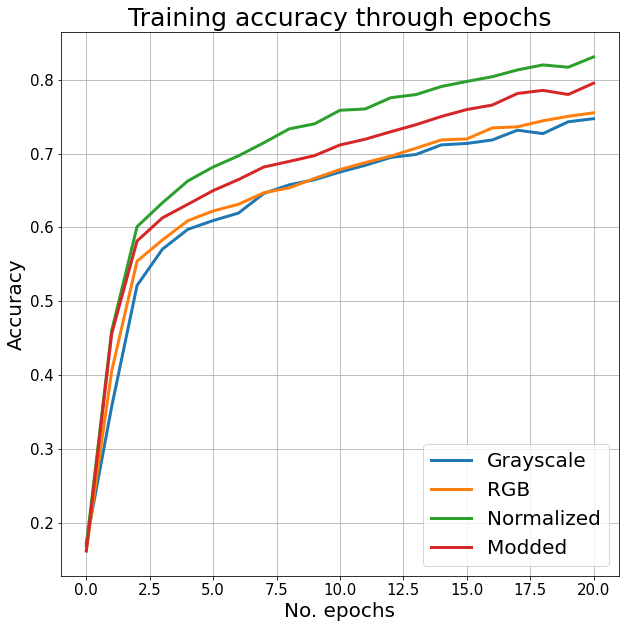

In [106]:
comp_datasets(train_epoch_rgb2, train_acc_gray2, train_acc_rgb2, train_acc_norm2, train_acc_mod2, 'Grayscale', 'RGB', 'Normalized', 'Modded')

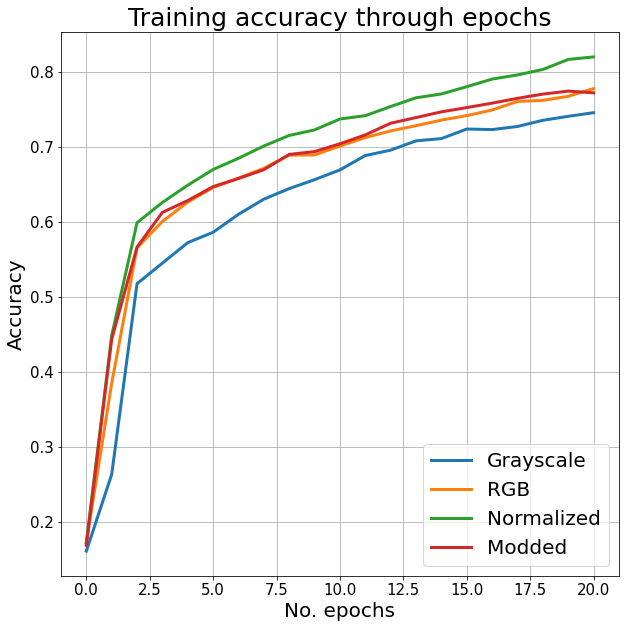

In [107]:
comp_datasets(train_epoch_rgb3, train_acc_gray3, train_acc_rgb3, train_acc_norm3, train_acc_mod3, 'Grayscale', 'RGB', 'Normalized', 'Modded')

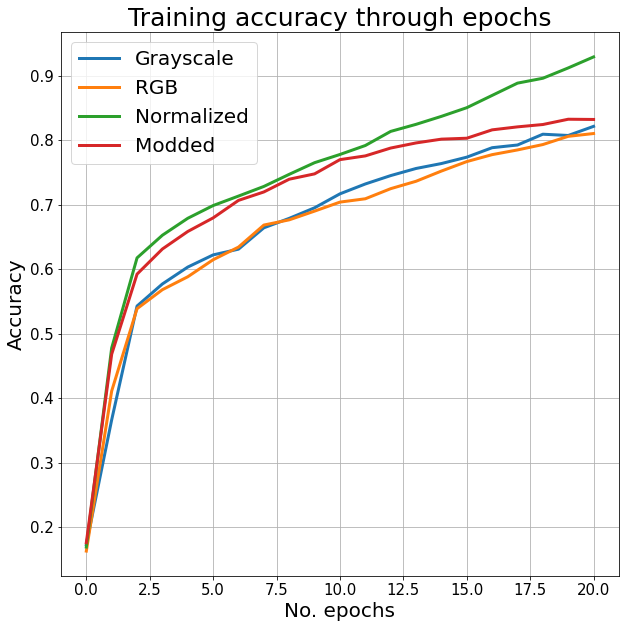

In [108]:
comp_datasets(train_epoch_rgb4, train_acc_gray4, train_acc_rgb4, train_acc_norm4, train_acc_mod4, 'Grayscale', 'RGB', 'Normalized', 'Modded')

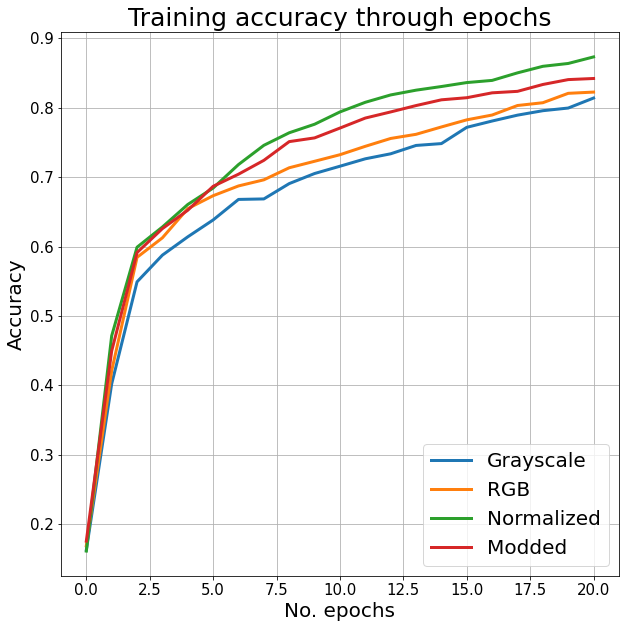

In [109]:
comp_datasets(train_epoch_rgb5, train_acc_gray5, train_acc_rgb5, train_acc_norm5, train_acc_mod5, 'Grayscale', 'RGB', 'Normalized', 'Modded')

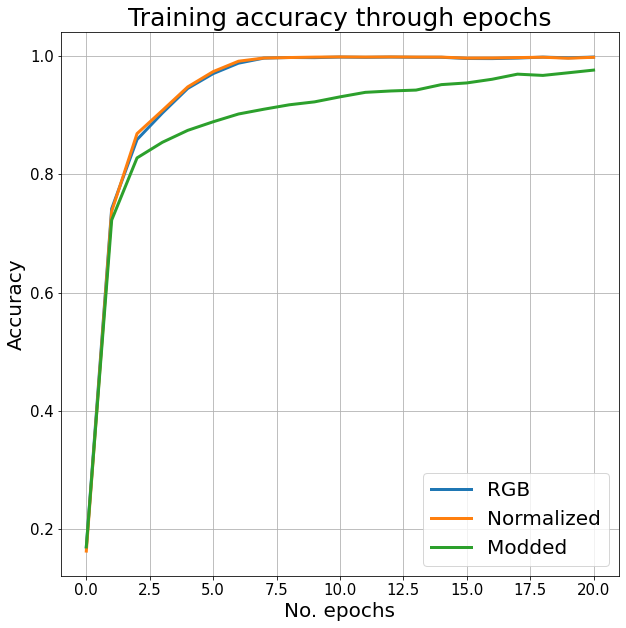

In [110]:
comp_datasets2(train_epoch_rgb6, train_acc_rgb6, train_acc_norm6, train_acc_mod6, 'RGB', 'Normalized', 'Modded')

In [111]:
def comp_datasets_(train_epoch, train_loss1, train_loss2, train_loss3, train_loss4, set1, set2, set3, set4):

    plt.figure(figsize=(10, 10))

    #PLOT ACCURACY
    #plt.subplot(1, 2, 1)
    plt.grid(True)
    # First line
    plt.plot(train_epoch, train_loss1, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
    # Second line
    plt.plot(train_epoch, train_loss2, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
    # Third line   
    plt.plot(train_epoch, train_loss3, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
    # Forth line
    plt.plot(train_epoch, train_loss4, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c')
    
    # Title
    plt.title('Valodation accuracy through epochs', fontsize=25)
    # Line labels
    plt.legend([set1, set2, set3, set4], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

In [112]:
def comp_datasets2_(train_epoch, train_loss1, train_loss2, train_loss3, set1, set2, set3):

    plt.figure(figsize=(10, 10))

    #PLOT ACCURACY
    #plt.subplot(1, 2, 1)
    plt.grid(True)
    # First line
    plt.plot(train_epoch, train_loss1, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
    # Second line
    plt.plot(train_epoch, train_loss2, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
    # Third line   
    plt.plot(train_epoch, train_loss3, linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
    
    # Title
    plt.title('Validation accuracy through epochs', fontsize=25)
    # Line labels
    plt.legend([set1, set2, set3], fontsize=20)
    # Axis labels
    plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

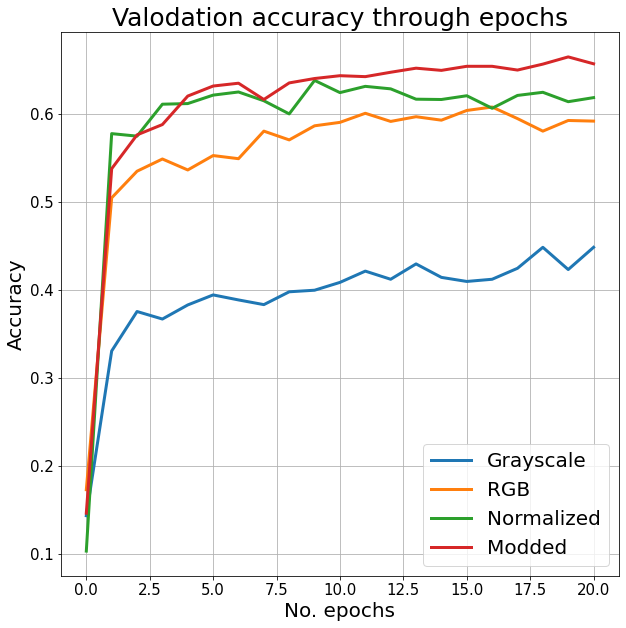

In [113]:
comp_datasets_(train_epoch_rgb0, val_acc_gray0, val_acc_rgb0, val_acc_norm0, val_acc_mod0, 'Grayscale', 'RGB', 'Normalized', 'Modded')

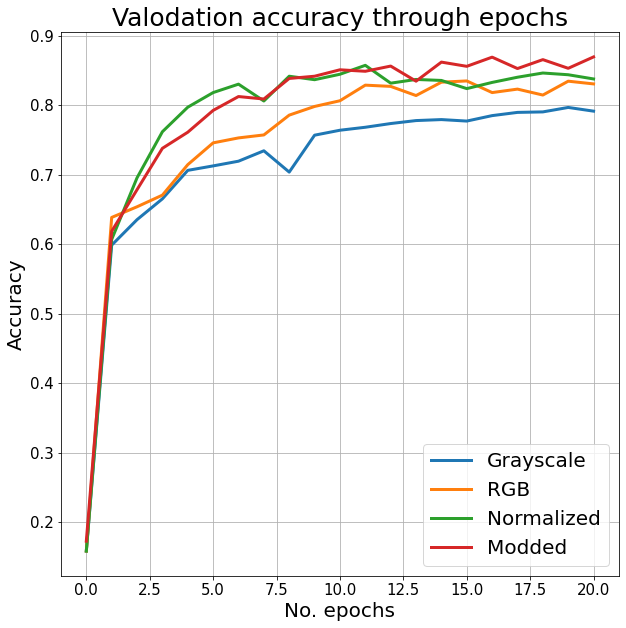

In [114]:
comp_datasets_(train_epoch_rgb1, val_acc_gray1, val_acc_rgb1, val_acc_norm1, val_acc_mod1, 'Grayscale', 'RGB', 'Normalized', 'Modded')

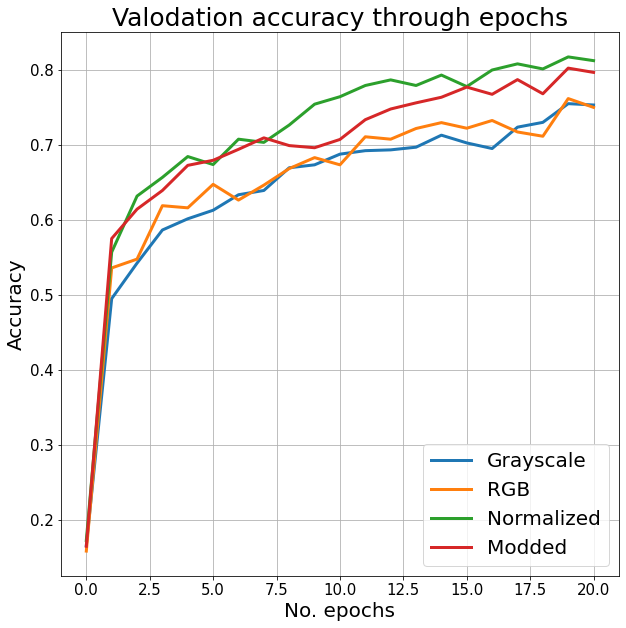

In [115]:
comp_datasets_(train_epoch_rgb2, val_acc_gray2, val_acc_rgb2, val_acc_norm2, val_acc_mod2, 'Grayscale', 'RGB', 'Normalized', 'Modded')

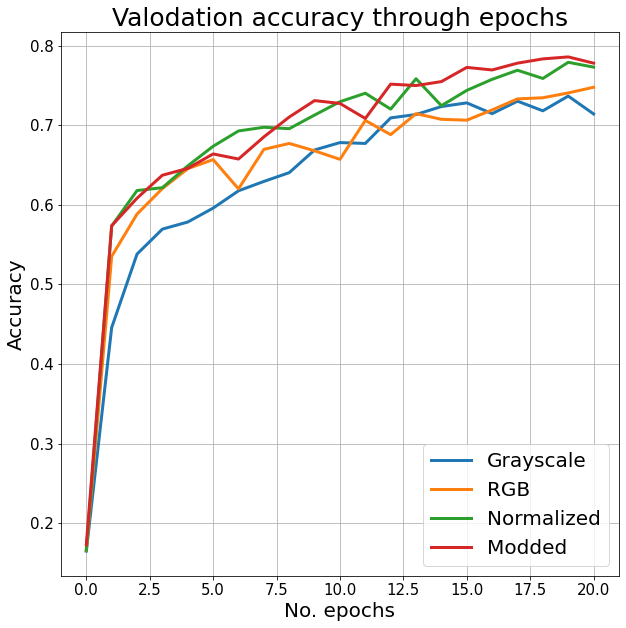

In [116]:
comp_datasets_(train_epoch_rgb3, val_acc_gray3, val_acc_rgb3, val_acc_norm3, val_acc_mod3, 'Grayscale', 'RGB', 'Normalized', 'Modded')

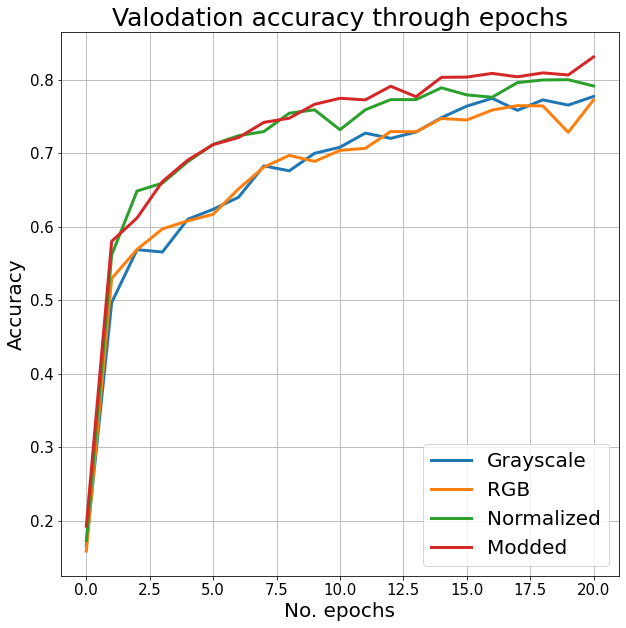

In [117]:
comp_datasets_(train_epoch_rgb4, val_acc_gray4, val_acc_rgb4, val_acc_norm4, val_acc_mod4, 'Grayscale', 'RGB', 'Normalized', 'Modded')

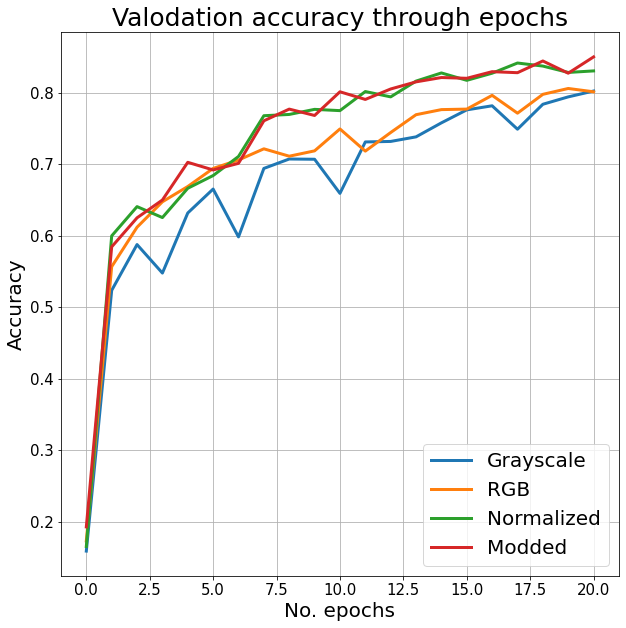

In [118]:
comp_datasets_(train_epoch_rgb5, val_acc_gray5, val_acc_rgb5, val_acc_norm5, val_acc_mod5, 'Grayscale', 'RGB', 'Normalized', 'Modded')

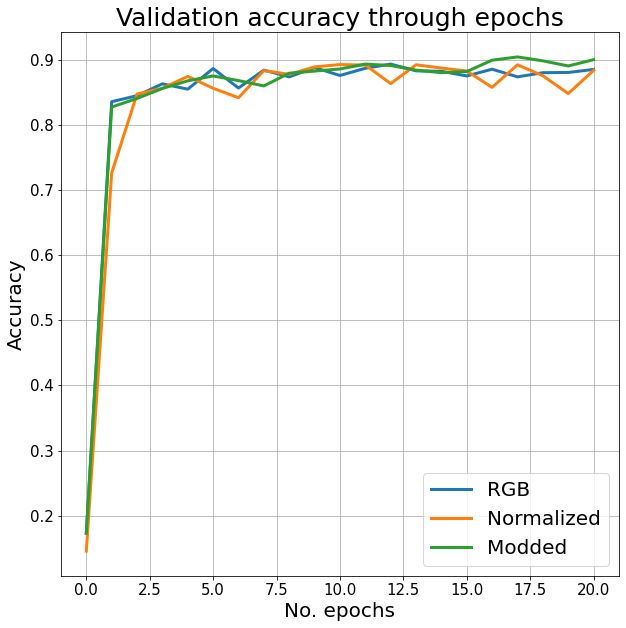

In [119]:
comp_datasets2_(train_epoch_rgb6, val_acc_rgb6, val_acc_norm6, val_acc_mod6, 'RGB', 'Normalized', 'Modded')

# **MEAN COMPARISONS**

In [120]:
gray_loss = torch.tensor([[val_loss_gray0], [val_loss_gray1], [val_loss_gray2], [val_loss_gray3], [val_loss_gray4], [val_loss_gray5]])
gray_loss_mean = gray_loss.mean(dim=0)

gray_acc = torch.tensor([[val_acc_gray0], [val_acc_gray1], [val_acc_gray2], [val_acc_gray3], [val_acc_gray4], [val_acc_gray5]])
gray_acc_mean = gray_acc.mean(dim=0)



rgb_loss = torch.tensor([[val_loss_rgb0], [val_loss_rgb1], [val_loss_rgb2], [val_loss_rgb3], [val_loss_rgb4], [val_loss_rgb5], [val_loss_rgb6]])
rgb_loss_mean = rgb_loss.mean(dim=0)

rgb_acc = torch.tensor([[val_acc_rgb0], [val_acc_rgb1], [val_acc_rgb2], [val_acc_rgb3], [val_acc_rgb4], [val_acc_rgb5], [val_acc_rgb6]])
rgb_acc_mean = rgb_acc.mean(dim=0)



norm_loss = torch.tensor([[val_loss_norm0], [val_loss_norm1], [val_loss_norm2], [val_loss_norm3], [val_loss_norm4], [val_loss_norm5], [val_loss_norm6]])
norm_loss_mean = norm_loss.mean(dim=0)

norm_acc = torch.tensor([[val_acc_norm0], [val_acc_norm1], [val_acc_norm2], [val_acc_norm3], [val_acc_norm4], [val_acc_norm5], [val_acc_norm6]])
norm_acc_mean = norm_acc.mean(dim=0)



mod_loss = torch.tensor([[val_loss_mod0], [val_loss_mod1], [val_loss_mod2], [val_loss_mod3], [val_loss_mod4], [val_loss_mod5], [val_loss_mod6]])
mod_loss_mean = mod_loss.mean(dim=0)

mod_acc = torch.tensor([[val_acc_mod0], [val_acc_mod1], [val_acc_mod2], [val_acc_mod3], [val_acc_mod4], [val_acc_mod5], [val_acc_mod6]])
mod_acc_mean = mod_acc.mean(dim=0)

In [121]:
gray_lossT = torch.tensor([[train_loss_gray0], [train_loss_gray1], [train_loss_gray2], [train_loss_gray3], [train_loss_gray4], [train_loss_gray5]])
gray_lossT_mean = gray_lossT.mean(dim=0)

gray_accT = torch.tensor([[train_acc_gray0], [train_acc_gray1], [train_acc_gray2], [train_acc_gray3], [train_acc_gray4], [train_acc_gray5]])
gray_accT_mean = gray_accT.mean(dim=0)


rgb_lossT = torch.tensor([[train_loss_rgb0], [train_loss_rgb1], [train_loss_rgb2], [train_loss_rgb3], [train_loss_rgb4], [train_loss_rgb5], [train_loss_rgb6]])
rgb_lossT_mean = rgb_lossT.mean(dim=0)

rgb_accT = torch.tensor([[train_acc_rgb0], [train_acc_rgb1], [train_acc_rgb2], [train_acc_rgb3], [train_acc_rgb4], [train_acc_rgb5], [train_acc_rgb6]])
rgb_accT_mean = rgb_accT.mean(dim=0)


norm_lossT = torch.tensor([[train_loss_norm0], [train_loss_norm1], [train_loss_norm2], [train_loss_norm3], [train_loss_norm4], [train_loss_norm5], [train_loss_norm6]])
norm_lossT_mean = norm_lossT.mean(dim=0)

norm_accT = torch.tensor([[train_acc_norm0], [train_acc_norm1], [train_acc_norm2], [train_acc_norm3], [train_acc_norm4], [train_acc_norm5], [train_acc_norm6]])
norm_accT_mean = norm_accT.mean(dim=0)


mod_lossT = torch.tensor([[train_loss_mod0], [train_loss_mod1], [train_loss_mod2], [train_loss_mod3], [train_loss_mod4], [train_loss_mod5], [train_loss_mod6]])
mod_lossT_mean = mod_lossT.mean(dim=0)

mod_accT = torch.tensor([[train_acc_mod0], [train_acc_mod1], [train_acc_mod2], [train_acc_mod3], [train_acc_mod4], [train_acc_mod5], [train_acc_mod6]])
mod_accT_mean = mod_accT.mean(dim=0)



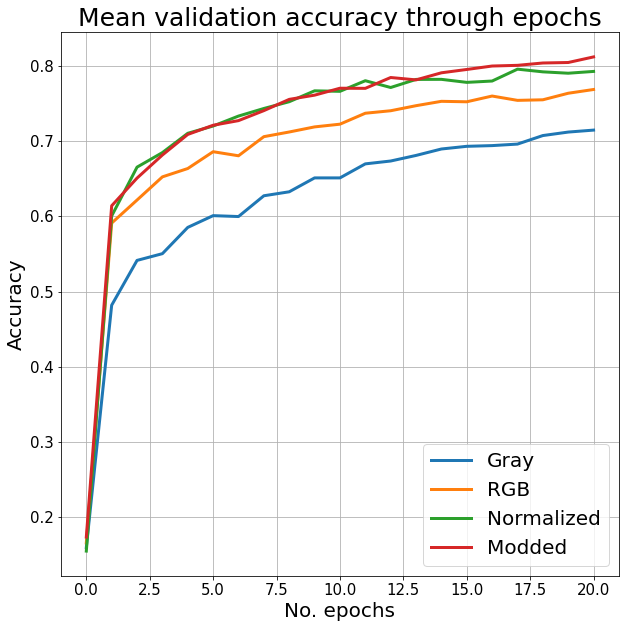

In [122]:

#PLOT MEAN VALID ACC - COMPARE SETS
plt.figure(figsize=(10, 10))
plt.grid(True)
# First line
plt.plot(range(0,21), gray_acc_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
# Second line
plt.plot(range(0,21), rgb_acc_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
# Third line   
plt.plot(range(0,21), norm_acc_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
# Forth line   
plt.plot(range(0,21), mod_acc_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c');
    
# Title
plt.title('Mean validation accuracy through epochs', fontsize=25)
# Line labels
plt.legend(['Gray', 'RGB', 'Normalized', 'Modded'], fontsize=20)
# Axis labels
plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
print()

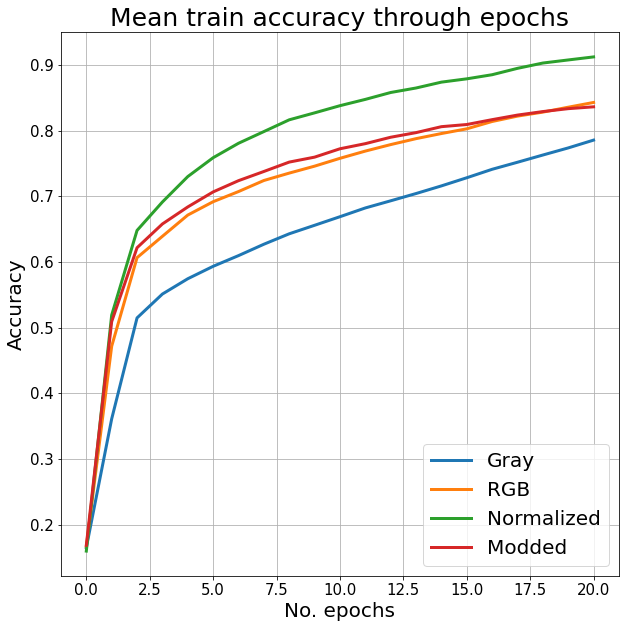

In [123]:

#PLOT MEAN TRAIN ACC - COMPARE SETS
plt.figure(figsize=(10, 10))
plt.grid(True)
# First line
plt.plot(range(0,21), gray_accT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
# Second line
plt.plot(range(0,21), rgb_accT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
# Third line   
plt.plot(range(0,21), norm_accT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
# Forth line   
plt.plot(range(0,21), mod_accT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c');
    
# Title
plt.title('Mean train accuracy through epochs', fontsize=25)
# Line labels
plt.legend(['Gray', 'RGB', 'Normalized', 'Modded'], fontsize=20)
# Axis labels
plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
print()

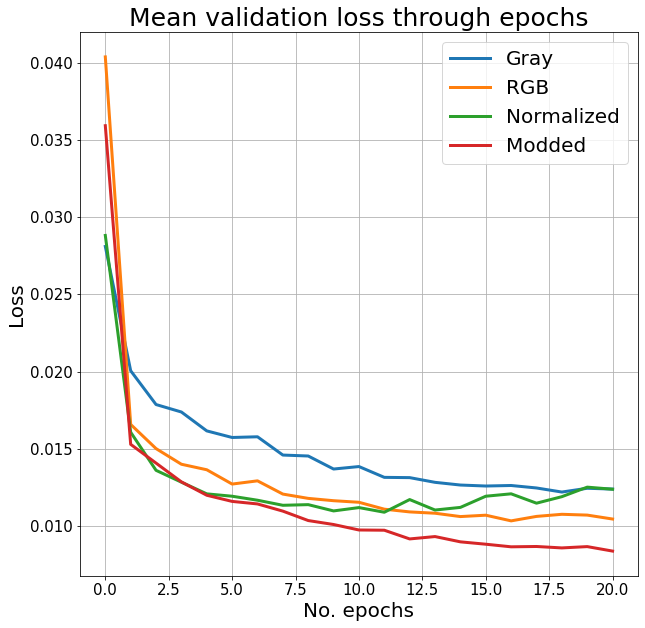

In [124]:

#PLOT MEAN VALID LOSS - COMPARE SETS
plt.figure(figsize=(10, 10))
plt.grid(True)
# First line
plt.plot(range(0,21), gray_loss_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
# Second line
plt.plot(range(0,21), rgb_loss_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
# Third line   
plt.plot(range(0,21), norm_loss_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
# Forth line   
plt.plot(range(0,21), mod_loss_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c');
    
# Title
plt.title('Mean validation loss through epochs', fontsize=25)
# Line labels
plt.legend(['Gray', 'RGB', 'Normalized', 'Modded'], fontsize=20)
# Axis labels
plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Loss', fontsize=20);
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
print()

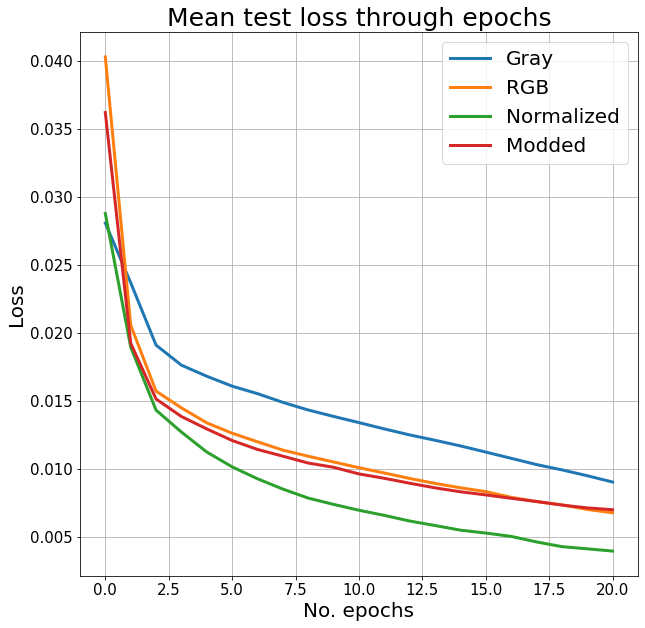

In [125]:

#PLOT MEAN TRAIN LOSS - COMPARE SETS
plt.figure(figsize=(10, 10))
plt.grid(True)
# First line
plt.plot(range(0,21), gray_lossT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
# Second line
plt.plot(range(0,21), rgb_lossT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
# Third line   
plt.plot(range(0,21), norm_lossT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
# Forth line   
plt.plot(range(0,21), mod_lossT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c');
    
# Title
plt.title('Mean test loss through epochs', fontsize=25)
# Line labels
plt.legend(['Gray', 'RGB', 'Normalized', 'Modded'], fontsize=20)
# Axis labels
plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Loss', fontsize=20);
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
print()

In [126]:
mod0_acc = torch.tensor([[val_acc_rgb0], [val_acc_norm0], [val_acc_mod0]])
mod0_acc_mean = mod0_acc.mean(dim=0)

mod0_loss = torch.tensor([[val_loss_rgb0], [val_loss_norm0], [val_loss_mod0]])
mod0_loss_mean = mod0_loss.mean(dim=0)



mod1_acc = torch.tensor([[val_acc_rgb1], [val_acc_norm1], [val_acc_mod1]])
mod1_acc_mean = mod1_acc.mean(dim=0)

mod1_loss = torch.tensor([[val_loss_rgb1], [val_loss_norm1], [val_loss_mod1]])
mod1_loss_mean = mod1_loss.mean(dim=0)



mod2_acc = torch.tensor([[val_acc_rgb2], [val_acc_norm2], [val_acc_mod2]])
mod2_acc_mean = mod2_acc.mean(dim=0)

mod2_loss = torch.tensor([[val_loss_rgb2], [val_loss_norm2], [val_loss_mod2]])
mod2_loss_mean = mod2_loss.mean(dim=0)



mod3_acc = torch.tensor([[val_acc_rgb3], [val_acc_norm3], [val_acc_mod3]])
mod3_acc_mean = mod3_acc.mean(dim=0)

mod3_loss = torch.tensor([[val_loss_rgb3], [val_loss_norm3], [val_loss_mod3]])
mod3_loss_mean = mod3_loss.mean(dim=0)



mod4_acc = torch.tensor([[val_acc_rgb4], [val_acc_norm4], [val_acc_mod4]])
mod4_acc_mean = mod4_acc.mean(dim=0)

mod4_loss = torch.tensor([[val_loss_rgb4], [val_loss_norm4], [val_loss_mod4]])
mod4_loss_mean = mod4_loss.mean(dim=0)



mod5_acc = torch.tensor([[val_acc_rgb5], [val_acc_norm5], [val_acc_mod5]])
mod5_acc_mean = mod5_acc.mean(dim=0)

mod5_loss = torch.tensor([[val_loss_rgb5], [val_loss_norm5], [val_loss_mod5]])
mod5_loss_mean = mod5_loss.mean(dim=0)



mod6_acc = torch.tensor([[val_acc_rgb6], [val_acc_norm6], [val_acc_mod6]])
mod6_acc_mean = mod6_acc.mean(dim=0)

mod6_loss = torch.tensor([[val_loss_rgb6], [val_loss_norm6], [val_loss_mod6]])
mod6_loss_mean = mod6_loss.mean(dim=0)

In [127]:
mod0_accT = torch.tensor([[train_acc_rgb0], [train_acc_norm0], [train_acc_mod0]])
mod0_accT_mean = mod0_accT.mean(dim=0)

mod0_lossT = torch.tensor([[train_loss_rgb0], [train_loss_norm0], [train_loss_mod0]])
mod0_lossT_mean = mod0_lossT.mean(dim=0)


mod1_accT = torch.tensor([[train_acc_rgb1], [train_acc_norm1], [train_acc_mod1]])
mod1_accT_mean = mod1_accT.mean(dim=0)

mod1_lossT = torch.tensor([[train_loss_rgb1], [train_loss_norm1], [train_loss_mod1]])
mod1_lossT_mean = mod1_lossT.mean(dim=0)


mod2_accT = torch.tensor([[train_acc_rgb2], [train_acc_norm2], [train_acc_mod2]])
mod2_accT_mean = mod2_accT.mean(dim=0)

mod2_lossT = torch.tensor([[train_loss_rgb2], [train_loss_norm2], [train_loss_mod2]])
mod2_lossT_mean = mod2_lossT.mean(dim=0)


mod3_accT = torch.tensor([[train_acc_rgb3], [train_acc_norm3], [train_acc_mod3]])
mod3_accT_mean = mod3_accT.mean(dim=0)

mod3_lossT = torch.tensor([[train_loss_rgb3], [train_loss_norm3], [train_loss_mod3]])
mod3_lossT_mean = mod3_lossT.mean(dim=0)


mod4_accT = torch.tensor([[train_acc_rgb4], [train_acc_norm4], [train_acc_mod4]])
mod4_accT_mean = mod4_accT.mean(dim=0)

mod4_lossT = torch.tensor([[train_loss_rgb4], [train_loss_norm4], [train_loss_mod4]])
mod4_lossT_mean = mod4_lossT.mean(dim=0)


mod5_accT = torch.tensor([[train_acc_rgb5], [train_acc_norm5], [train_acc_mod5]])
mod5_accT_mean = mod5_accT.mean(dim=0)

mod5_lossT = torch.tensor([[train_loss_rgb5], [train_loss_norm5], [train_loss_mod5]])
mod5_lossT_mean = mod5_lossT.mean(dim=0)


mod6_accT = torch.tensor([[train_acc_rgb6], [train_acc_norm6], [train_acc_mod6]])
mod6_accT_mean = mod6_accT.mean(dim=0)

mod6_lossT = torch.tensor([[train_loss_rgb6], [train_loss_norm6], [train_loss_mod6]])
mod6_lossT_mean = mod6_lossT.mean(dim=0)



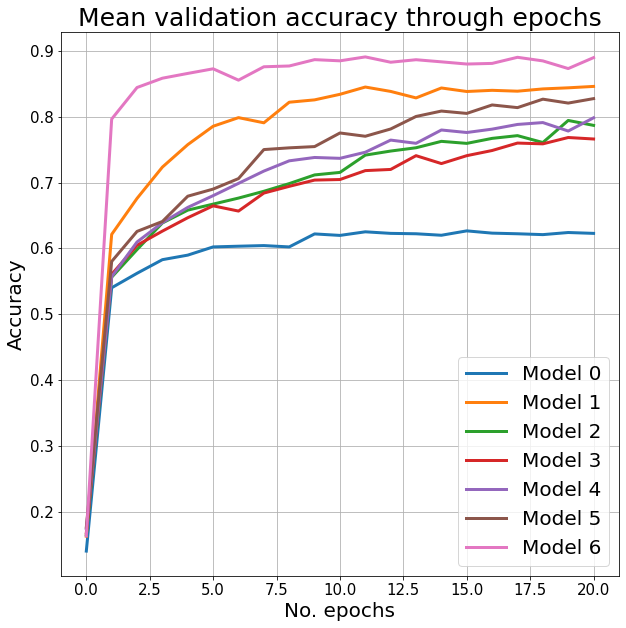

In [128]:
#PLOT VALID ACC - COMPARE MODELS
plt.figure(figsize=(10, 10))
plt.grid(True)
# First line
plt.plot(range(0,21), mod0_acc_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
# Second line
plt.plot(range(0,21), mod1_acc_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
# Third line   
plt.plot(range(0,21), mod2_acc_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
# Forth line   
plt.plot(range(0,21), mod3_acc_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c');
# Fifth line
plt.plot(range(0,21), mod4_acc_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='m');
# Sixth line   
plt.plot(range(0,21), mod5_acc_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='y');
# Seventh line   
plt.plot(range(0,21), mod6_acc_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='k');
    
# Title
plt.title('Mean validation accuracy through epochs', fontsize=25)
# Line labels
plt.legend(['Model 0', 'Model 1', 'Model 2', 'Model 3', 'Model 4', 'Model 5', 'Model 6'], fontsize=20)
# Axis labels
plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
print()

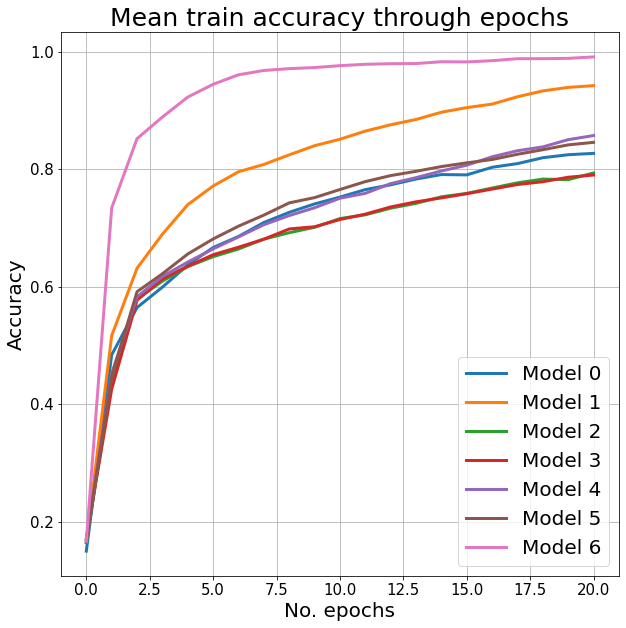

In [129]:
#PLOT TRAIN ACC - COMPARE MODELS
plt.figure(figsize=(10, 10))
plt.grid(True)
# First line
plt.plot(range(0,21), mod0_accT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
# Second line
plt.plot(range(0,21), mod1_accT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
# Third line   
plt.plot(range(0,21), mod2_accT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
# Forth line   
plt.plot(range(0,21), mod3_accT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c');
# Fifth line
plt.plot(range(0,21), mod4_accT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='m');
# Sixth line   
plt.plot(range(0,21), mod5_accT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='y');
# Seventh line   
plt.plot(range(0,21), mod6_accT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='k');
    
# Title
plt.title('Mean train accuracy through epochs', fontsize=25)
# Line labels
plt.legend(['Model 0', 'Model 1', 'Model 2', 'Model 3', 'Model 4', 'Model 5', 'Model 6'], fontsize=20)
# Axis labels
plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
print()

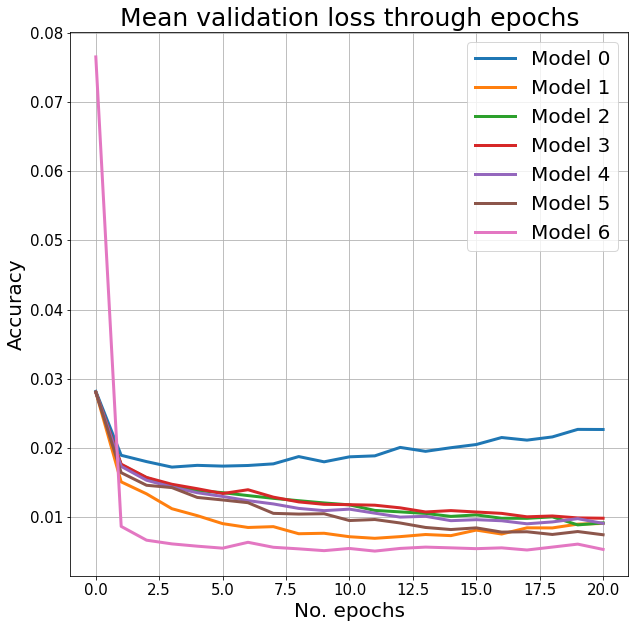

In [130]:
#PLOT VALID LOSS - COMPARE MODELS
plt.figure(figsize=(10, 10))
plt.grid(True)
# First line
plt.plot(range(0,21), mod0_loss_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
# Second line
plt.plot(range(0,21), mod1_loss_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
# Third line   
plt.plot(range(0,21), mod2_loss_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
# Forth line   
plt.plot(range(0,21), mod3_loss_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c');
# Fifth line
plt.plot(range(0,21), mod4_loss_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='m');
# Sixth line   
plt.plot(range(0,21), mod5_loss_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='y');
# Seventh line   
plt.plot(range(0,21), mod6_loss_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='k');
    
# Title
plt.title('Mean validation loss through epochs', fontsize=25)
# Line labels
plt.legend(['Model 0', 'Model 1', 'Model 2', 'Model 3', 'Model 4', 'Model 5', 'Model 6'], fontsize=20)
# Axis labels
plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
print()

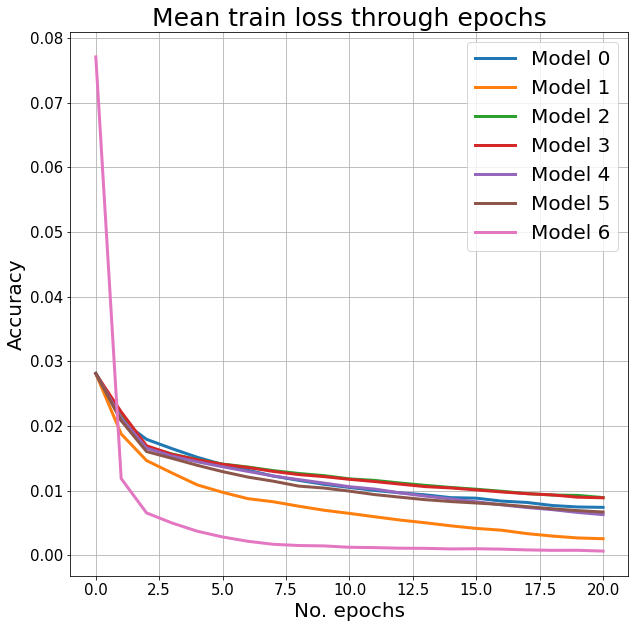

In [131]:
#PLOT TRAIN LOSS - COMPARE MODELS
plt.figure(figsize=(10, 10))
plt.grid(True)
# First line
plt.plot(range(0,21), mod0_lossT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='b')
# Second line
plt.plot(range(0,21), mod1_lossT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='g');
# Third line   
plt.plot(range(0,21), mod2_lossT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='r');
# Forth line   
plt.plot(range(0,21), mod3_lossT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='c');
# Fifth line
plt.plot(range(0,21), mod4_lossT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='m');
# Sixth line   
plt.plot(range(0,21), mod5_lossT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='y');
# Seventh line   
plt.plot(range(0,21), mod6_lossT_mean.squeeze(0), linewidth=3, markersize=10, markeredgewidth=3, markeredgecolor='k');
    
# Title
plt.title('Mean train loss through epochs', fontsize=25)
# Line labels
plt.legend(['Model 0', 'Model 1', 'Model 2', 'Model 3', 'Model 4', 'Model 5', 'Model 6'], fontsize=20)
# Axis labels
plt.xlabel('No. epochs', fontsize=20); plt.ylabel('Accuracy', fontsize=20);
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
print()

In [132]:
print("ALL TEST ACCURACIES:\n",
    "gray0:", ACC_gray0, "\n",
    "gray1:", ACC_gray1,"\n",
    "gray2:", ACC_gray2,"\n",
    "gray3:", ACC_gray3,"\n",
    "gray4:", ACC_gray4,"\n",
    "gray5:", ACC_gray5,"\n",

    "rgb0: ", ACC_rgb0,"\n",
    "rgb1: ", ACC_rgb1,"\n",
    "rgb2: ", ACC_rgb2,"\n",
    "rgb3: ", ACC_rgb3,"\n",
    "rgb4: ", ACC_rgb4,"\n",
    "rgb5: ", ACC_rgb5,"\n",
    "rgb6: ", ACC_rgb6,"\n",

    "norm0: ", ACC_norm0,"\n",
    "norm1: ", ACC_norm1,"\n",
    "norm2: ", ACC_norm2,"\n",
    "norm3: ", ACC_norm3,"\n",
    "norm4: ", ACC_norm4,"\n",
    "norm5: ", ACC_norm5,"\n",
    "norm6: ", ACC_norm6,"\n",

    "mod0: ", ACC_mod0,"\n",
    "mod1: ", ACC_mod1,"\n",
    "mod2: ", ACC_mod2,"\n",
    "mod3: ", ACC_mod3,"\n",
    "mod4: ", ACC_mod4,"\n",
    "mod5: ", ACC_mod5,"\n",
    "mod6: ", ACC_mod6)

ALL TEST ACCURACIES:
 gray0: 42.766666666666666 
 gray1: 78.5 
 gray2: 73.23333333333333 
 gray3: 69.3 
 gray4: 77.4 
 gray5: 78.43333333333334 
 rgb0:  58.03333333333334 
 rgb1:  82.39999999999999 
 rgb2:  73.4 
 rgb3:  75.0 
 rgb4:  77.53333333333333 
 rgb5:  79.16666666666666 
 rgb6:  88.33333333333333 
 norm0:  60.13333333333334 
 norm1:  83.73333333333333 
 norm2:  80.13333333333334 
 norm3:  76.06666666666668 
 norm4:  78.3 
 norm5:  83.73333333333333 
 norm6:  87.9 
 mod0:  63.53333333333333 
 mod1:  86.93333333333332 
 mod2:  78.56666666666666 
 mod3:  76.96666666666667 
 mod4:  81.83333333333334 
 mod5:  84.46666666666667 
 mod6:  89.5



As I said earlier, we would try the model out on some never seen examples. The test and prediction sets are here for us. (Remember, while the test set contains the correct labels to the images, the prediction set only contains images.) There are 4 functions I created - 2 for grayscale, 2 for RGB images - also 1-1 for the test, and prediction sets.


With the pred_chart functions You can predict unlabeld images, therefore You can not be sure, the classification is correct, but You can see the probabilities accordint to the given model.

With the test_chart functions You can compare the predictid label(s) probability with the currect image label.

In [133]:
def pred_chart_gray(model, img, classes):
    plt.figure(figsize=(5,5))
    plt.imshow(img[0].squeeze(0), cmap='gray')
    with torch.no_grad():
        probs = (F.softmax(model(img[0]))).squeeze(0)
    #max_index = np.argmax(probs) #detect predicted label
    plt.figure(figsize=(5,3))
    plt.bar(classes, probs)
    #second color predicted bar (for visual)
    #plt.bar(max_index, probs[max_index]) 
    plt.xticks(fontsize=10, rotation=60)

In [134]:
def test_chart_gray(model, img, classes):
    plt.figure(figsize=(5,5))
    plt.imshow(img[0].squeeze(0), cmap='gray')
    with torch.no_grad():
        probs = (F.softmax(model(img[0]))).squeeze(0)
    correct_index = img[1] #correct label
    plt.figure(figsize=(5,3))
    plt.bar(classes, probs)
    #new bar for the correct label, with second color
    plt.bar(correct_index, probs[correct_index]) 
    plt.xticks(fontsize=10, rotation=60)

In [135]:
def pred_chart_rgb(model, img, classes):
    plt.figure(figsize=(5,5))
    plt.imshow((img[0].squeeze(0)).permute((1,2,0)))
    with torch.no_grad():
        probs = (F.softmax(model(img[0].unsqueeze(0)), dim=1)).squeeze(0)
    #max_index = np.argmax(probs) #detect predicted label
    plt.figure(figsize=(5,3))
    plt.bar(classes, probs)
    #second color predicted bar (for visual)
    #plt.bar(max_index, probs[max_index]) 
    plt.xticks(fontsize=10, rotation=60)

In [136]:
def test_chart_rgb(model, img, classes):
    plt.figure(figsize=(5,5))
    plt.imshow((img[0]).permute((1,2,0)))
    with torch.no_grad():
        probs = (F.softmax(model(img[0].unsqueeze(0)), dim=1)).squeeze(0)
    correct_index = img[1] #correct label
    plt.figure(figsize=(5,3))
    plt.bar(classes, probs)
    #new bar for the correct label, with second color
    plt.bar(correct_index, probs[correct_index]) 
    plt.xticks(fontsize=10, rotation=60)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


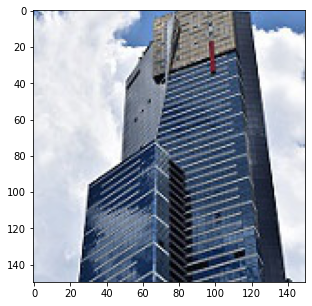

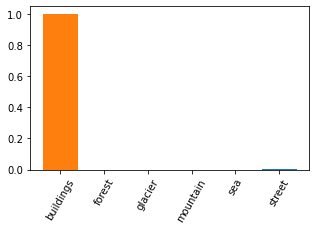

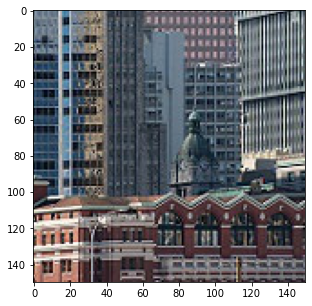

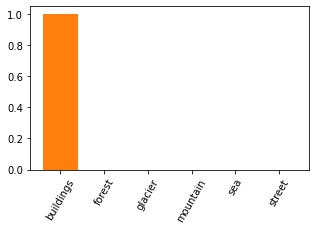

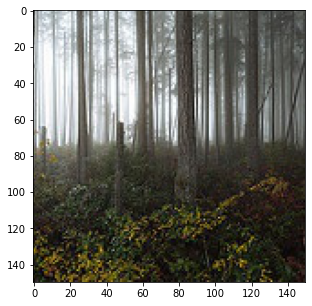

...

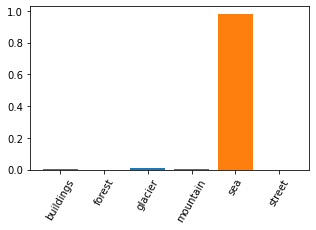

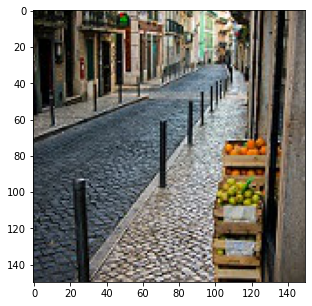

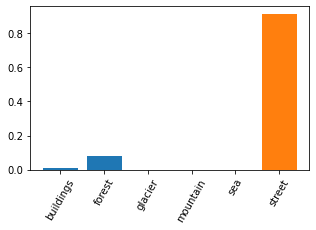

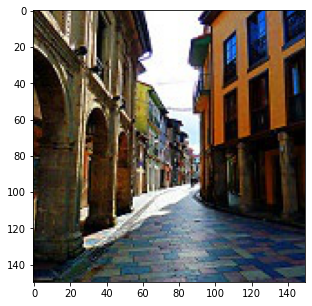

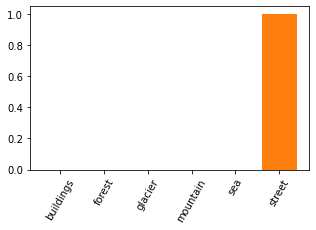

In [137]:
model = to_device(model_rgb6, 'cpu')

for i in range(0, 3000, 243):
    test_chart_rgb(model, test_ds[i], test_ds.classes)

In [138]:
model = to_device(model_rgb4, 'cpu')
test_chart_rgb_grid(model, test_ds[1103], test_ds.classes, )

NameError: name 'test_chart_rgb_grid' is not defined

We give them an image, and all the classes it could be, then the function will gives us some prediction probabilities on the seen images. If we use the test set, orange color marks the correct label of the given image.

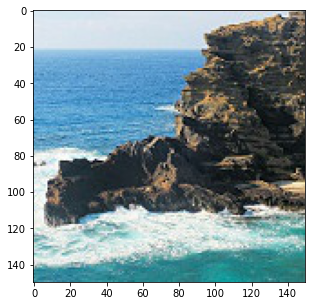

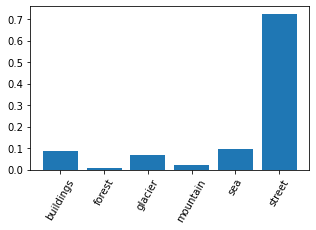

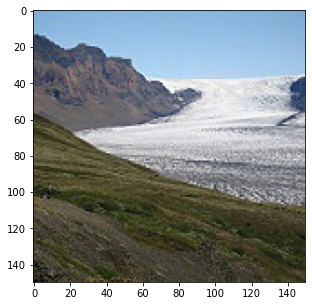

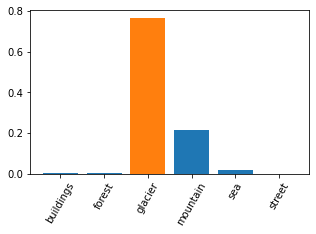

In [139]:
#TODO: keresni pár olyan képet, ahol rossz volt a prediction, és úgy kirajzolni a grafót alá
#      esetleg táblázatba rendezni pár ilyen statisztikát
model = to_device(model, 'cpu')
pred_chart_rgb(model, test_ds[2413], test_ds.classes)
test_chart_rgb(model, test_ds[1103], test_ds.classes)

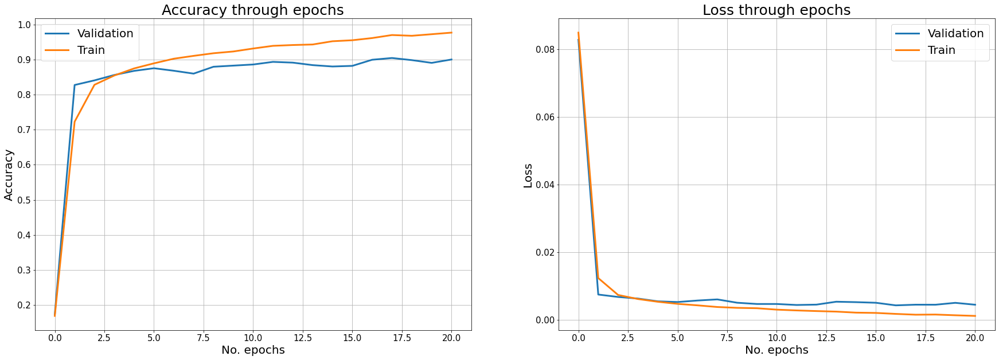

In [140]:
plot_loss_and_acc(val_epoch_mod6, val_acc_mod6, train_acc_mod6, val_loss_mod6, train_loss_mod6)

# **CONFUSION MATRIX**

I also put in the project a section for plotting confusion matrix about the results of the model.

In [141]:
#Learnt this method from DeepLizard

In [142]:
def get_preds(model, dataloader):
    
    predictions = torch.as_tensor([])
    
    for batch in dataloader:
        images, labels = batch
        preds = model(images)
        
        predictions = torch.cat((to_device(predictions, device), to_device(preds, device)), dim=0)
        
    return predictions

In [143]:
model = to_device(model_mod6, device)
with torch.no_grad():
    norm_test_preds_loader = DataLoader(norm_test_ds, batch_size = 100)
    norm_test_preds_loader = DeviceDataLoader(norm_test_preds_loader, device)
    test_preds_rgb = get_preds(model, norm_test_preds_loader)

In [144]:
from sklearn.metrics import confusion_matrix


import itertools
import numpy as np
import matplotlib.pyplot as plt

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #print("Normalized confusion matrix")
    #else:
        #print('Confusion matrix, without normalization')

    #print(cm)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [145]:
cm = torch.zeros((6,6), dtype=torch.int32)

In [146]:
cm = confusion_matrix(norm_test_ds.targets, to_device(test_preds_rgb.argmax(dim=1), "cpu"))

Confusion matrix of the model Model 6 (ResNet9), trained on the modded dataset, tested on the normalized dataset


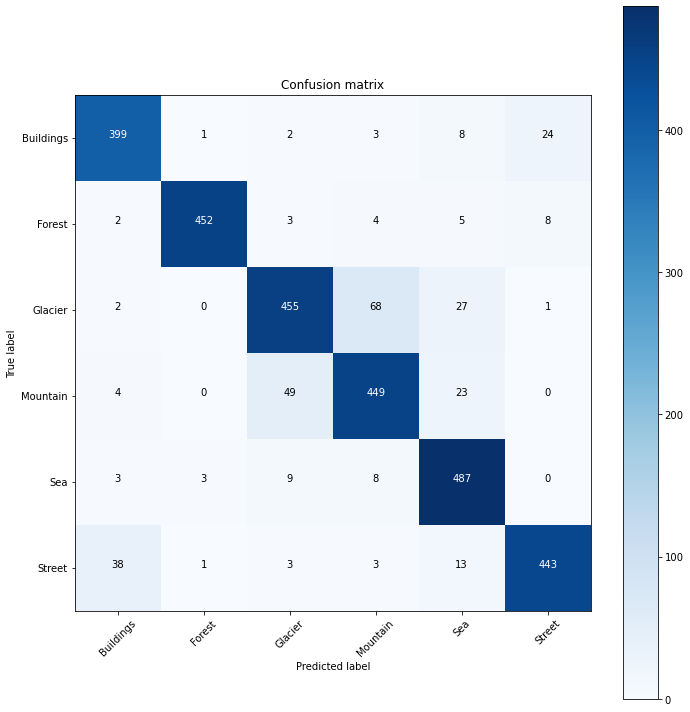

In [147]:
names = ['Buildings', 'Forest', 'Glacier', 'Mountain', 'Sea', 'Street']
plt.figure(figsize=(10,10))
plot_confusion_matrix(cm, names)
print("Confusion matrix of the model Model 6 (ResNet9), trained on the modded dataset, tested on the normalized dataset")

I used the test dataset, so the network hasn't seem any of the images previously. Here we can see, where the model makes mistakes. It sometimes mixes up the mountains with glacier, and the buildings with the streets. Well, they can be similar, and notice, my accuracy is not that well in this version of the project.

# **METRICS AND SAVE**

It's great to have a nice model, but what if we would like to use it tomorrow, or even a year from now? That is why we should always save the best working model. What is the best model we got? Well, we can save the metrics and hyperparameters of all the models, we just want, after we can circle back to the model with the best result, and save that model for future work.

In [148]:
"""torch.save(model.state_dict(), 'intel-classification-ResNet9_v2.pth')"""

"torch.save(model.state_dict(), 'intel-classification-ResNet9_v2.pth')"

In [149]:
"""#Test the saved model on the test set
with torch.no_grad():
    corr = 0
    for batch in test_dl:
        torch.cuda.empty_cache()
        images, labels = batch
        preds = model2(images)
        corr += get_num_correct(preds, labels)
        
print(corr, "/ ", test_size, "\t", f'{(corr/test_size * 100):.2f}', "%")"""

'#Test the saved model on the test set\nwith torch.no_grad():\n    corr = 0\n    for batch in test_dl:\n        torch.cuda.empty_cache()\n        images, labels = batch\n        preds = model2(images)\n        corr += get_num_correct(preds, labels)\n        \nprint(corr, "/ ", test_size, "\t", f\'{(corr/test_size * 100):.2f}\', "%")'

### This notebook was created as a freeCodeCamp (jovian.ml) PyTorch course project work.

## References

* https://www.kaggle.com/puneet6060/intel-image-classification
* https://jovian.ml/forum/c/pytorch-zero-to-gans/18
* http://alexlenail.me/NN-SVG/AlexNet.html
* https://deeplizard.com/learn/video/0LhiS6yu2qQ
* https://raw.githubusercontent.com/lambdal/cifar10-fast/master/net.svg?sanitize=true